# Measuring all 5 protocols and 4 player sizes (720p+) (quality auto) on the test VM -- 2 videos

In [1]:
import pandas as pd
import sqlite3
import datetime
import numpy as np
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import PercentFormatter
import math
import Cdf
import Pmf
from urllib.parse import urlparse, parse_qs
mpl.rcParams['figure.dpi'] = 200
okabe_ito = ["#000000", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
sns.set_context('paper')
sns.set_palette(sns.color_palette(okabe_ito))
#https://stackoverflow.com/a/45846841
def human_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][magnitude])
def make_cdf(series):
    return series.value_counts(normalize=True).sort_index().cumsum()
def make_pdf(series):
    return series.value_counts(normalize=True).sort_index()

In [143]:
conn = sqlite3.connect('web-performance-youtube-two-videos.db')

In [3]:
#conn = sqlite3.connect('web-performance-youtube-two-videos.db')
measurements = pd.read_sql_query("SELECT * FROM measurements", conn)
measurements
#conn.close()

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error
0,315fc1b3-1c8b-1a99-619f-b6710c7ef174,-1,-1.000000e+00,-1.000000e+00,tls,94.140.14.140,aqz-KE-bpKQ,,2022-02-28 15:37:15.423442,auto,1280,720,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",1,
1,77ca19fd-cf26-e754-72d5-ad927757591e,1646062671917013199,1.646063e+12,1.646063e+12,tls,94.140.14.140,aqz-KE-bpKQ,,2022-02-28 15:37:18.520742,auto,1280,720,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,
2,86a4f8aa-3794-71ea-6511-502b73830cb9,-1,-1.000000e+00,-1.000000e+00,tls,94.140.14.140,lqiN98z6Dak,,2022-02-28 15:37:53.686765,auto,1280,720,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",1,
3,74a14fc6-06f8-299e-e53c-7d8d985fd683,1646062710220279197,1.646063e+12,1.646063e+12,tls,94.140.14.140,lqiN98z6Dak,,2022-02-28 15:37:56.821131,auto,1280,720,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,
4,bcc3f68f-9e68-ac7e-fddb-f7b70b2e5b31,-1,-1.000000e+00,-1.000000e+00,tls,94.140.14.140,aqz-KE-bpKQ,,2022-02-28 15:38:35.186758,auto,1920,1080,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",1,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,bd43277d-1103-bee8-ea3a-7b9117af5d18,1646535322726838689,1.646535e+12,1.646535e+12,udp,94.140.14.140,lqiN98z6Dak,,2022-03-06 02:54:49.468216,auto,2560,1440,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,
20636,e17eb265-bff9-9b18-0ffa-76ccc93839cc,-1,-1.000000e+00,-1.000000e+00,udp,94.140.14.140,aqz-KE-bpKQ,,2022-03-06 02:55:27.155753,auto,3840,2160,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",1,
20637,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,1646535363841242631,1.646535e+12,1.646535e+12,udp,94.140.14.140,aqz-KE-bpKQ,,2022-03-06 02:55:30.406412,auto,3840,2160,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,
20638,1c6dd4ab-9af0-0f1a-8010-ede218107a05,-1,-1.000000e+00,-1.000000e+00,udp,94.140.14.140,lqiN98z6Dak,,2022-03-06 02:56:05.675791,auto,3840,2160,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",1,


# data pre-processing

In [4]:
measurements.groupby(['cacheWarming', 'error']).agg({'msm_id':pd.Series.nunique})

,,msm_id
cacheWarming,error,
0,,10320
1,,10320


In [6]:
measurements = measurements[measurements.error == '']

remove cache warming runs early to reduce processing later on

In [7]:
measurements = measurements[measurements.cacheWarming == 0]

In [8]:
measurements['player_width'] = measurements['player_width'].astype(str)
measurements['player_height'] = measurements['player_height'].astype(str)
measurements['player_dimensions'] = measurements['player_width']+"x"+measurements['player_height']

In [9]:
measurements['protocol'] = measurements['protocol'].str.upper()

In [10]:
dns_proto_mapping = {'QUIC':'DoQ', 'HTTPS':'DoH', 'TLS':'DoT', 'TCP':'DoTCP', 'UDP':'DoUDP'}
def map_proto_to_dns(x):
    return dns_proto_mapping[x]
measurements['protocol'] = measurements['protocol'].map(map_proto_to_dns)

In [11]:
measurements

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error,player_dimensions
1,77ca19fd-cf26-e754-72d5-ad927757591e,1646062671917013199,1.646063e+12,1.646063e+12,DoT,94.140.14.140,aqz-KE-bpKQ,,2022-02-28 15:37:18.520742,auto,1280,720,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,1280x720
3,74a14fc6-06f8-299e-e53c-7d8d985fd683,1646062710220279197,1.646063e+12,1.646063e+12,DoT,94.140.14.140,lqiN98z6Dak,,2022-02-28 15:37:56.821131,auto,1280,720,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,1280x720
5,5548ccfe-2cca-6944-5905-4f397ff89101,1646062751771817120,1.646063e+12,1.646063e+12,DoT,94.140.14.140,aqz-KE-bpKQ,,2022-02-28 15:38:38.320198,auto,1920,1080,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,1920x1080
7,4e618f7c-9fcc-b3d2-ef15-ee8aff76c4cd,1646062790748462145,1.646063e+12,1.646063e+12,DoT,94.140.14.140,lqiN98z6Dak,,2022-02-28 15:39:17.566936,auto,1920,1080,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,1920x1080
9,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,1646062832373938256,1.646063e+12,1.646063e+12,DoT,94.140.14.140,aqz-KE-bpKQ,,2022-02-28 15:39:58.826239,auto,2560,1440,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,2560x1440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20631,549fd3f1-d08a-ca79-a0e0-5e478863c785,1646535243187340249,1.646535e+12,1.646535e+12,DoUDP,94.140.14.140,lqiN98z6Dak,,2022-03-06 02:53:29.918214,auto,1920,1080,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,1920x1080
20633,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,1646535284594341681,1.646535e+12,1.646535e+12,DoUDP,94.140.14.140,aqz-KE-bpKQ,,2022-03-06 02:54:11.199511,auto,2560,1440,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,2560x1440
20635,bd43277d-1103-bee8-ea3a-7b9117af5d18,1646535322726838689,1.646535e+12,1.646535e+12,DoUDP,94.140.14.140,lqiN98z6Dak,,2022-03-06 02:54:49.468216,auto,2560,1440,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,2560x1440
20637,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,1646535363841242631,1.646535e+12,1.646535e+12,DoUDP,94.140.14.140,aqz-KE-bpKQ,,2022-03-06 02:55:30.406412,auto,3840,2160,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,3840x2160


## find the optimal resolution as determined by the youtube player for each run

In [12]:
df_optimal_resolutions = pd.read_sql_query("""
SELECT msm_id, resolution, time FROM nerd_stats
""", conn)

In [13]:
df_optimal_resolutions['current_res'] = df_optimal_resolutions['resolution'].str.split(' / ').str[0]
df_optimal_resolutions['current_res'] = df_optimal_resolutions['current_res'].str.split('@').str[0]
df_optimal_resolutions['optimal_res'] = df_optimal_resolutions['resolution'].str.split(' / ').str[1]
df_optimal_resolutions['optimal_res'] = df_optimal_resolutions['optimal_res'].str.split('@').str[0]
df_optimal_resolutions['time'] = pd.to_datetime(df_optimal_resolutions['time'], unit='ms', origin='unix')

In [14]:
df_optimal_resolutions = df_optimal_resolutions[['msm_id','optimal_res', 'time', 'current_res']]

In [15]:
df_optimal_resolutions.groupby('msm_id').optimal_res.nunique().sort_values()

msm_id
000219ac-5509-32f6-4f20-5a80e85b81cf    1
ab5964f1-2728-1727-2392-ed5e7610d784    1
ab5b4696-64f2-c03e-b2e7-c83ac35c4e99    1
ab5c9d2f-fa65-45f3-ae12-424fad67d40d    1
ab6510f4-d2b8-5ae0-21e2-b5acba4af7cc    1
                                       ..
3ac63069-7df6-a2dc-b834-45de2765f631    2
096aeca4-3007-5237-8c51-826569ee912e    2
ae9bd609-cae4-7ec5-63d0-2340521278fc    2
4886627a-2814-59cf-2dad-a55b97ed2f51    2
ee06693b-5c18-a443-cf1c-e50e2891879c    2
Name: optimal_res, Length: 10320, dtype: int64

### filter out measurements where the player changes the optimal resolution within the run (mostly from 4k to 1440p)

In [16]:
s_filter_msm = df_optimal_resolutions.groupby('msm_id').optimal_res.nunique()

In [17]:
s_filter_msm[s_filter_msm > 1].index.tolist()

['096aeca4-3007-5237-8c51-826569ee912e',
 '24e73799-899f-ebee-3314-65464ab14601',
 '3ac63069-7df6-a2dc-b834-45de2765f631',
 '3b9df8f4-03cc-c148-cd2a-d356dcf27e43',
 '4886627a-2814-59cf-2dad-a55b97ed2f51',
 'ae9bd609-cae4-7ec5-63d0-2340521278fc',
 'dd9bbf36-1cbd-6f7a-4c99-dc68a36aee0c',
 'ee06693b-5c18-a443-cf1c-e50e2891879c']

In [18]:
df_optimal_resolutions[df_optimal_resolutions.msm_id.isin(s_filter_msm[s_filter_msm > 1].index.tolist())].sort_values('time').groupby(['msm_id', 'optimal_res']).agg({'time':'min'}).sort_values('time')

time
msm_id                               optimal_res                              
096aeca4-3007-5237-8c51-826569ee912e 3840x2160   2022-03-01 19:04:12.232999936
                                     2560x1440   2022-03-01 19:04:42.320999936
3b9df8f4-03cc-c148-cd2a-d356dcf27e43 3840x2160   2022-03-02 06:50:16.976000000
                                     2560x1440   2022-03-02 06:50:36.678200064
dd9bbf36-1cbd-6f7a-4c99-dc68a36aee0c 3840x2160   2022-03-03 00:25:32.680600064
                                     2560x1440   2022-03-03 00:25:57.442900224
4886627a-2814-59cf-2dad-a55b97ed2f51 3840x2160   2022-03-03 01:14:58.101400064
                                     2560x1440   2022-03-03 01:15:28.131600128
ae9bd609-cae4-7ec5-63d0-2340521278fc 3840x2160   2022-03-03 08:44:57.952399872
                                     2560x1440   2022-03-03 08:45:27.814099968
3ac63069-7df6-a2dc-b834-45de2765f631 3840x2160   2022-03-03 11:04:16.712800000
                                     2560x1440   2022-03-03 11:04:41.574300160
ee06693b-5c18-a443-cf1c-e50e2891879c 3840x2160   2022-03-03 18:44:52.136900096
                                     2560x1440   2022-03-03 18:45:12.464600064
24e73799-899f-ebee-3314-65464ab14601 3840x2160   2022-03-04 04:50:15.846700032
                                     2560x1440   2022-03-04 04:50:36.004199936

first idea: we take the nerd stats optimal res at the end of playback (i.e. the furthest in terms of video playback) as the "true" optimal res  ------ probably dumb idea, see example above, for now just filter out the ones with multiple optimal resolutions?

In [19]:
#assert set(df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].msm_id.value_counts().values) == {1}
#assert df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].msm_id.nunique() == measurements.msm_id.nunique()
#df_optimal_resolutions = df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].reset_index(drop=True)


In [20]:
df_msms_with_multiple_opt_res = df_optimal_resolutions.groupby('msm_id', as_index=False).agg(opt_res_num=('optimal_res',pd.Series.nunique), opt_res_list=('optimal_res',pd.Series.unique)).sort_values('opt_res_num')

In [21]:
df_msms_with_multiple_opt_res[df_msms_with_multiple_opt_res.opt_res_num > 1]

,msm_id,opt_res_num,opt_res_list
2409,3b9df8f4-03cc-c148-cd2a-d356dcf27e43,2,"[3840x2160, 2560x1440]"
8941,dd9bbf36-1cbd-6f7a-4c99-dc68a36aee0c,2,"[3840x2160, 2560x1440]"
1466,24e73799-899f-ebee-3314-65464ab14601,2,"[3840x2160, 2560x1440]"
2374,3ac63069-7df6-a2dc-b834-45de2765f631,2,"[3840x2160, 2560x1440]"
388,096aeca4-3007-5237-8c51-826569ee912e,2,"[3840x2160, 2560x1440]"
7011,ae9bd609-cae4-7ec5-63d0-2340521278fc,2,"[3840x2160, 2560x1440]"
2897,4886627a-2814-59cf-2dad-a55b97ed2f51,2,"[3840x2160, 2560x1440]"
9629,ee06693b-5c18-a443-cf1c-e50e2891879c,2,"[3840x2160, 2560x1440]"


In [22]:
measurements_to_remove = df_msms_with_multiple_opt_res[df_msms_with_multiple_opt_res.opt_res_num > 1].msm_id.unique().tolist()

In [23]:
measurements_to_remove

['3b9df8f4-03cc-c148-cd2a-d356dcf27e43',
 'dd9bbf36-1cbd-6f7a-4c99-dc68a36aee0c',
 '24e73799-899f-ebee-3314-65464ab14601',
 '3ac63069-7df6-a2dc-b834-45de2765f631',
 '096aeca4-3007-5237-8c51-826569ee912e',
 'ae9bd609-cae4-7ec5-63d0-2340521278fc',
 '4886627a-2814-59cf-2dad-a55b97ed2f51',
 'ee06693b-5c18-a443-cf1c-e50e2891879c']

In [24]:
measurements[measurements.msm_id.isin(measurements_to_remove)].player_dimensions.value_counts()

3840x2160    8
Name: player_dimensions, dtype: int64

In [25]:
measurements[measurements.msm_id.isin(measurements_to_remove)].protocol.value_counts()

DoQ      3
DoT      2
DoTCP    2
DoUDP    1
Name: protocol, dtype: int64

In [26]:
measurements[measurements.player_dimensions == "3840x2160"].protocol.value_counts()

DoT      516
DoH      516
DoQ      516
DoTCP    516
DoUDP    516
Name: protocol, dtype: int64

In [27]:
measurements = measurements[~measurements.msm_id.isin(measurements_to_remove)]

In [28]:
df_optimal_resolutions = df_optimal_resolutions[~df_optimal_resolutions.msm_id.isin(measurements_to_remove)][['msm_id', 'optimal_res']].drop_duplicates().reset_index().drop('index', axis=1)

In [29]:
df_optimal_resolutions

,msm_id,optimal_res
0,77ca19fd-cf26-e754-72d5-ad927757591e,1280x720
1,74a14fc6-06f8-299e-e53c-7d8d985fd683,1280x720
2,5548ccfe-2cca-6944-5905-4f397ff89101,1920x1080
3,4e618f7c-9fcc-b3d2-ef15-ee8aff76c4cd,1920x1080
4,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,2560x1440
...,...,...
10307,549fd3f1-d08a-ca79-a0e0-5e478863c785,1920x1080
10308,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,2560x1440
10309,bd43277d-1103-bee8-ea3a-7b9117af5d18,2560x1440
10310,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,3840x2160


In [30]:
df_optimal_resolutions = pd.merge(df_optimal_resolutions, measurements[['msm_id', 'player_dimensions']], on='msm_id')
df_optimal_resolutions

,msm_id,optimal_res,player_dimensions
0,77ca19fd-cf26-e754-72d5-ad927757591e,1280x720,1280x720
1,74a14fc6-06f8-299e-e53c-7d8d985fd683,1280x720,1280x720
2,5548ccfe-2cca-6944-5905-4f397ff89101,1920x1080,1920x1080
3,4e618f7c-9fcc-b3d2-ef15-ee8aff76c4cd,1920x1080,1920x1080
4,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,2560x1440,2560x1440
...,...,...,...
10307,549fd3f1-d08a-ca79-a0e0-5e478863c785,1920x1080,1920x1080
10308,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,2560x1440,2560x1440
10309,bd43277d-1103-bee8-ea3a-7b9117af5d18,2560x1440,2560x1440
10310,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,3840x2160,3840x2160


### make sure the optimal resolutions match what we set as the player size

In [31]:
df_optimal_resolutions[df_optimal_resolutions.optimal_res != df_optimal_resolutions.player_dimensions]

,msm_id,optimal_res,player_dimensions


### make sure each run has a start playing event that fired before 1s of playtime passed (there seems to always be a little bit of playtime (i.e. the curr play time when the event fires is never zero) presumably due to the delay from javascript execution between getting the playback time within the callback)

In [32]:
df_player_state_playing = pd.read_sql_query("select time, msm_id, curr_play_time from iframe_api where event_type = 'PlayerStatePLAYING'", conn)

In [33]:
df_player_state_playing[df_player_state_playing.curr_play_time > 1].curr_play_time.describe()

count    4016.000000
mean       19.900396
std         2.213903
min         4.556201
25%        17.943333
50%        19.350333
75%        21.121000
max        28.257000
Name: curr_play_time, dtype: float64

In [34]:
df_player_state_playing[df_player_state_playing.curr_play_time < 1].curr_play_time.describe()

count    10320.000000
mean         0.022081
std          0.011032
min          0.003080
25%          0.017132
50%          0.020784
75%          0.023632
max          0.204029
Name: curr_play_time, dtype: float64

In [35]:
df_player_state_intial_playback = df_player_state_playing[(df_player_state_playing.curr_play_time < 1) & 
                                    (df_player_state_playing.msm_id.isin(measurements.msm_id.unique()))]

make sure each measurement only has one corresponding initial playing state event and that all measurements have such an event

In [36]:
assert set(df_player_state_intial_playback.msm_id.value_counts().values) == {1}
assert pd.Series.nunique(df_player_state_intial_playback.msm_id.value_counts().index) == \
pd.Series.nunique(measurements['msm_id'])

### if the 1s metric produced a unique start playing state event for each run, we can use it to calculate the startup delay between when we tell the player to start playing and when it actually plays

In [37]:
df_start_time = pd.read_sql_query("""
SELECT start_time, play_time, msm_id, current_quality AS initial_quality FROM
(SELECT time AS start_time, msm_id FROM iframe_api WHERE event_type = 'PlayStartedFromFunction')
JOIN
(SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time < 1)
USING (msm_id);
""", conn)
df_start_time = df_start_time[df_start_time.msm_id.isin(measurements.msm_id.unique())]

df_start_time['start_time'] = pd.to_datetime(df_start_time['start_time'], unit='ms', origin='unix')
df_start_time['play_time'] = pd.to_datetime(df_start_time['play_time'], unit='ms', origin='unix')

df_start_time['startup_delay'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds()

In [38]:
df_start_time

,start_time,play_time,msm_id,initial_quality,startup_delay
0,2022-02-28 15:37:20.970100224,2022-02-28 15:37:21.411300096,77ca19fd-cf26-e754-72d5-ad927757591e,hd720,0.4412
1,2022-02-28 15:37:59.203100160,2022-02-28 15:37:59.610300160,74a14fc6-06f8-299e-e53c-7d8d985fd683,hd720,0.4072
2,2022-02-28 15:38:40.754400000,2022-02-28 15:38:41.106200064,5548ccfe-2cca-6944-5905-4f397ff89101,hd1080,0.3518
3,2022-02-28 15:39:19.916600064,2022-02-28 15:39:20.310300160,4e618f7c-9fcc-b3d2-ef15-ee8aff76c4cd,hd1080,0.3937
4,2022-02-28 15:40:01.187099904,2022-02-28 15:40:01.830899968,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,hd1440,0.6438
...,...,...,...,...,...
10315,2022-03-06 02:53:32.267800064,2022-03-06 02:53:32.589499904,549fd3f1-d08a-ca79-a0e0-5e478863c785,hd1080,0.3217
10316,2022-03-06 02:54:13.615799808,2022-03-06 02:54:13.981399808,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,hd1440,0.3656
10317,2022-03-06 02:54:51.783100160,2022-03-06 02:54:52.086500096,bd43277d-1103-bee8-ea3a-7b9117af5d18,hd1440,0.3034
10318,2022-03-06 02:55:32.792800000,2022-03-06 02:55:33.212499968,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,hd1440,0.4197


### for each measurement we call getQuality when the player fires the start playing callback, however this seems to again be susceptible to some delay, some measurements have quality change events for that resolution fire __after__ the recorded timestamp for the playing event ---> thus we figure out the quality change event that happened closest to the timestamp of the start playing event but still happened before it

In [39]:
df_player_quality_change_event = pd.read_sql_query("select msm_id, time, curr_play_time, current_quality from iframe_api where event_type LIKE 'QualityChange%'", conn)
df_player_quality_change_event = df_player_quality_change_event[df_player_quality_change_event.msm_id.isin(measurements.msm_id.unique())]

In [40]:
df_player_quality_change_event['time'] = pd.to_datetime(df_player_quality_change_event['time'], unit='ms', origin='unix')

In [41]:
df_player_quality_change_event.curr_play_time.value_counts().sort_index()

0.000000     20251
0.007861         1
0.014238         1
0.014550         1
0.015112         1
             ...  
27.831033        1
27.854435        1
27.863678        1
27.868164        1
27.924962        1
Name: curr_play_time, Length: 1091, dtype: int64

In [42]:
df_player_quality_change_event[df_player_quality_change_event.curr_play_time == 0].msm_id.value_counts()

a28dc11d-01be-a896-8ad5-ec78a0caa9fd    3
103aa76f-3c04-e424-8a5f-9088a110ac8e    3
c2dbcf6c-c29a-9ff9-7d23-b18f5d371346    3
55424416-cd4d-ceb5-fff4-6368a05b3f4b    3
5ef8a0d3-2924-f7c6-d745-f1be43e4ca60    3
                                       ..
231b99b2-199b-5351-a14f-660b3373851f    1
54047b10-ffbb-669d-dace-025daad23389    1
1e3b39ab-0837-208a-91f3-8af3fad43239    1
71b362b0-f79d-62e3-7ea1-1bd4a47c9c88    1
5cf8c7f4-55f4-cba8-3b83-0cc20ad29a53    1
Name: msm_id, Length: 10312, dtype: int64

In [43]:
df_player_quality_change_event[df_player_quality_change_event.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,msm_id,time,curr_play_time,current_quality
5670,e37a4c5f-daee-4fc3-41de-3a2787a97d81,2022-03-02 02:12:49.285099776,0.0,large
5671,e37a4c5f-daee-4fc3-41de-3a2787a97d81,2022-03-02 02:13:03.694500096,0.0,hd720
5672,e37a4c5f-daee-4fc3-41de-3a2787a97d81,2022-03-02 02:13:03.747699968,0.0,hd1080


In [44]:
measurements[measurements.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error,player_dimensions
5479,e37a4c5f-daee-4fc3-41de-3a2787a97d81,1646187200221406423,1.646187e+12,1.646187e+12,DoQ,94.140.14.140,lqiN98z6Dak,,2022-03-02 02:12:46.670774,auto,1920,1080,0,30,"aqz-KE-bpKQ, lqiN98z6Dak",0,,1920x1080


In [45]:
df_start_time[df_start_time.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,start_time,play_time,msm_id,initial_quality,startup_delay
2739,2022-03-02 02:12:49.105399808,2022-03-02 02:13:03.855099904,e37a4c5f-daee-4fc3-41de-3a2787a97d81,hd1080,14.7497


In [46]:
df_true_initial_quality = pd.merge(df_start_time[['msm_id', 'play_time', 'initial_quality']], df_player_quality_change_event[df_player_quality_change_event.curr_play_time < 1][['time', 'current_quality', 'msm_id']], on='msm_id')


In [47]:
df_true_initial_quality['delay_to_play_time'] = (df_true_initial_quality['play_time'] - df_true_initial_quality['time']).dt.total_seconds()

In [48]:
df_true_initial_quality[df_true_initial_quality.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,msm_id,play_time,initial_quality,time,current_quality,delay_to_play_time
5507,e37a4c5f-daee-4fc3-41de-3a2787a97d81,2022-03-02 02:13:03.855099904,hd1080,2022-03-02 02:12:49.285099776,large,14.5700
5508,e37a4c5f-daee-4fc3-41de-3a2787a97d81,2022-03-02 02:13:03.855099904,hd1080,2022-03-02 02:13:03.694500096,hd720,0.1606
5509,e37a4c5f-daee-4fc3-41de-3a2787a97d81,2022-03-02 02:13:03.855099904,hd1080,2022-03-02 02:13:03.747699968,hd1080,0.1074


In [49]:
df_true_initial_quality = df_true_initial_quality[df_true_initial_quality.delay_to_play_time > 0]

In [50]:
df_true_initial_quality = df_true_initial_quality.loc[df_true_initial_quality.groupby('msm_id').delay_to_play_time.idxmin()].reset_index(drop=True)

In [51]:
df_true_initial_quality[df_true_initial_quality.initial_quality != df_true_initial_quality.current_quality]

,msm_id,play_time,initial_quality,time,current_quality,delay_to_play_time
130,03058d57-5f70-09f1-02d1-c1cc4f614a44,2022-03-05 18:23:34.099100160,hd1080,2022-03-05 18:23:33.992900096,large,0.1062
304,077f98aa-1e79-ebd0-d384-275f9dd75478,2022-03-01 05:42:58.664499968,hd1080,2022-03-01 05:42:58.571599872,large,0.0929
325,07ff3227-d8a5-a645-9903-b400cbf27bb0,2022-03-03 22:12:54.014899968,hd1080,2022-03-03 22:12:53.798299904,large,0.2166
392,0981396c-5783-3547-affb-9ab982a2c34a,2022-03-01 09:37:31.944499968,hd1080,2022-03-01 09:37:31.829699840,large,0.1148
463,0b1b92de-d383-766c-5822-68d1d4846699,2022-02-28 19:36:08.260699904,hd720,2022-02-28 19:36:07.912499968,large,0.3482
...,...,...,...,...,...,...
10041,f83a277b-f64f-77de-7f45-20b0a93384df,2022-03-01 18:25:37.148199936,hd1440,2022-03-01 18:25:37.041899776,medium,0.1063
10138,fae1b1c9-f1ed-7d8d-21ae-665655c7ff59,2022-03-03 23:43:33.215200000,hd1440,2022-03-03 23:43:33.082500096,medium,0.1327
10197,fc66269a-7d8e-a392-afe7-b96749d96735,2022-03-01 18:55:34.689099776,hd2160,2022-03-01 18:55:34.561399808,medium,0.1277
10219,fd363867-3b57-38b6-9da1-744bf897b221,2022-03-02 03:18:13.220399872,hd1080,2022-03-02 03:18:13.050400000,large,0.1700


In [52]:
df_true_initial_quality.rename(columns=lambda x: x.replace('current_quality', 'true_initial_quality'), inplace=True)

In [53]:
df_true_initial_quality

,msm_id,play_time,initial_quality,time,true_initial_quality,delay_to_play_time
0,000219ac-5509-32f6-4f20-5a80e85b81cf,2022-03-03 16:11:32.987000064,hd720,2022-03-03 16:11:32.966700288,hd720,0.0203
1,0003b249-791f-a8bd-95c8-3fd8f2fdacfa,2022-03-01 08:21:37.558500096,hd720,2022-03-01 08:21:37.407200000,hd720,0.1513
2,0004eaf6-6cdc-9977-b364-0736e522c9bb,2022-03-01 13:42:54.756000000,hd1080,2022-03-01 13:42:54.662500096,hd1080,0.0935
3,000ca07e-c52c-7088-0168-b452e0ce50a7,2022-03-03 16:24:58.271299840,hd1440,2022-03-03 16:24:58.271200000,hd1440,0.0001
4,001e3025-1c69-00ac-b8bb-8480b9f1a443,2022-03-05 01:53:31.594700032,hd1080,2022-03-05 01:53:31.499000064,hd1080,0.0957
...,...,...,...,...,...,...
10307,ffeb79a6-cd12-224f-5112-0ce187b3c4c5,2022-03-04 09:38:07.962099968,hd1440,2022-03-04 09:38:07.856199936,hd1440,0.1059
10308,ffefeeaa-abd0-57b6-3719-6c689999dce1,2022-03-01 05:20:13.980900096,hd2160,2022-03-01 05:20:13.864800000,hd2160,0.1161
10309,fff0047b-515d-34bf-35d3-763998591c8d,2022-03-02 01:50:15.264600064,hd2160,2022-03-02 01:50:15.250200320,hd2160,0.0144
10310,fff90e69-5b99-675f-b438-6254b593afb8,2022-03-04 16:14:53.764499968,hd2160,2022-03-04 16:14:53.693799936,hd2160,0.0707


### helper functions

In [54]:
res_to_quality = {
    "256x144":"tiny", "426x240": "small", "640x360": "medium", "854x480": "large",
    "1280x720": "hd720", "1920x1080": "hd1080", "2560x1440": "hd1440", "3840x2160": "hd2160"
}

quality_to_res = {v: k for k, v in res_to_quality.items()}

def map_quality_to_res(quality):
    return quality_to_res[quality]
def map_res_to_quality(resolution):
    return res_to_quality[resolution]

def make_quality_column_sortable(df_, col_name_):
    df_[col_name_] = pd.Categorical(df_[col_name_], ['auto', 'tiny', 'small', 'medium', 'large', 'hd720', 'hd1080', 'highres', 'hd1440', 'hd2160'])

def make_res_column_sortable(df_, col_name_):
    df_[col_name_] = pd.Categorical(df_[col_name_], ['256x144', '426x240', '640x360', '854x480', '1280x720', '1920x1080', '2560x1440', '3840x2160'])

In [55]:
df_resource_timing = pd.read_sql_query("SELECT msm_id, name, nextHopProtocol, domainLookupStart, domainLookupEnd FROM page_resources", conn)
#df_resource_timing = df_resource_timing[df_resource_timing.msm_id.isin(measurements.msm_id.unique())]

In [56]:
df_resource_timing['googlevideo'] = df_resource_timing.name.str.split('/').str[2]

In [57]:
df_resource_timing.googlevideo.unique()

array(['rr2---sn-4g5lzner.googlevideo.com',
       'rr4---sn-4g5e6nsr.googlevideo.com',
       'rr4---sn-4g5ednde.googlevideo.com',
       'rr2---sn-4g5ednly.googlevideo.com',
       'r4---sn-4g5e6nsr.googlevideo.com',
       'r2---sn-4g5ednly.googlevideo.com',
       'r2---sn-4g5lzner.googlevideo.com',
       'rr4---sn-5hnekn7k.googlevideo.com',
       'rr4---sn-5hne6nz6.googlevideo.com',
       'rr2---sn-5hne6nsr.googlevideo.com',
       'rr4---sn-4g5ednly.googlevideo.com',
       'rr2---sn-5hnekn7z.googlevideo.com',
       'r4---sn-4g5ednde.googlevideo.com'], dtype=object)

In [58]:
def find_initial_requests(url_):
    parse_res = urlparse(url_)
    opts = parse_qs(parse_res.query)
    if opts['range'][0][0] == '0':
        return True
    return False
df_resource_timing['first_request'] = df_resource_timing['name'].map(find_initial_requests)

In [59]:
df_resource_timing['h1_first_request'] = False
df_resource_timing['h1_first_request'] = np.where((df_resource_timing.nextHopProtocol == 'http/1.1') & (df_resource_timing.first_request == True), True, df_resource_timing['h1_first_request'])

In [60]:
df_resource_timing = pd.merge(df_resource_timing, pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn))

In [61]:
df_resource_timing[df_resource_timing.cacheWarming == 0].groupby('msm_id', as_index=False).agg({'googlevideo':pd.Series.nunique}).sort_values('googlevideo')

,msm_id,googlevideo
0,000219ac-5509-32f6-4f20-5a80e85b81cf,1
6872,ab55d659-261c-6043-ee68-b986aebc0e5b,1
6873,ab5964f1-2728-1727-2392-ed5e7610d784,1
6874,ab5b4696-64f2-c03e-b2e7-c83ac35c4e99,1
6875,ab5c9d2f-fa65-45f3-ae12-424fad67d40d,1
...,...,...
3416,55424416-cd4d-ceb5-fff4-6368a05b3f4b,2
6514,a28dc11d-01be-a896-8ad5-ec78a0caa9fd,2
1027,1993a29e-0ca2-b4f2-fadd-d70cd1c9ab51,2
4589,72b58b54-0be5-b9c3-a6de-437d1a0da68e,2


In [62]:
df_caught_first_request = df_resource_timing.groupby('msm_id', as_index=False).agg({'first_request': lambda x: sum(x) > 0, 'h1_first_request': lambda x: sum(x) > 0})

In [63]:
print(df_caught_first_request[df_caught_first_request.first_request == True].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.first_request == False].msm_id.nunique())
print(df_caught_first_request.msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.h1_first_request == True].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.h1_first_request == False].msm_id.nunique())
print(df_caught_first_request.msm_id.nunique())

975
9345
10320
365
9955
10320


In [64]:
df_caught_first_request = pd.merge(df_caught_first_request, pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn))

In [65]:
print(df_caught_first_request[(df_caught_first_request.first_request == True) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.first_request == False) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 0].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == True) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == False) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 0].msm_id.nunique())

975
9345
10320
365
9955
10320


In [66]:
print(df_caught_first_request[(df_caught_first_request.first_request == True) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.first_request == False) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 1].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == True) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == False) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 1].msm_id.nunique())

0
0
0
0
0
0


In [67]:
df_resource_timing.msm_id.nunique()

10320

In [68]:
df_resource_timing.domainLookupStart.describe()

count    128339.000000
mean      15728.644517
std        8889.923386
min           0.000000
25%        7971.800000
50%       13949.100000
75%       23064.200000
max       35647.700000
Name: domainLookupStart, dtype: float64

In [69]:
df_resource_timing.domainLookupEnd.describe()

count    128339.000000
mean      15728.675132
std        8889.877837
min           0.000000
25%        7971.800000
50%       13949.100000
75%       23064.200000
max       35647.700000
Name: domainLookupEnd, dtype: float64

In [70]:
df_resource_timing[df_resource_timing.domainLookupStart == 0]

,msm_id,name,nextHopProtocol,domainLookupStart,domainLookupEnd,googlevideo,first_request,h1_first_request,cacheWarming,player_dimensions,timestamp
2932,5202506a-7d69-0e63-2feb-64b1b55b8959,https://rr2---sn-4g5ednly.googlevideo.com/vide...,,0.0,0.0,rr2---sn-4g5ednly.googlevideo.com,True,False,0,1920x1080,2022-02-28 18:52:52.517592
6631,d40298c6-a627-95bf-66d4-d53cc93cd486,https://rr2---sn-4g5lzner.googlevideo.com/vide...,,0.0,0.0,rr2---sn-4g5lzner.googlevideo.com,False,False,0,3840x2160,2022-02-28 22:34:06.648180
29462,5dd6ca14-406f-3a18-0425-62c687ff841d,https://rr2---sn-4g5ednly.googlevideo.com/vide...,,0.0,0.0,rr2---sn-4g5ednly.googlevideo.com,False,False,0,3840x2160,2022-03-01 21:34:10.208970
33984,103aa76f-3c04-e424-8a5f-9088a110ac8e,https://rr4---sn-4g5ednde.googlevideo.com/vide...,,0.0,0.0,rr4---sn-4g5ednde.googlevideo.com,True,False,0,2560x1440,2022-03-02 02:08:47.562173
34012,55424416-cd4d-ceb5-fff4-6368a05b3f4b,https://rr4---sn-4g5ednde.googlevideo.com/vide...,,0.0,0.0,rr4---sn-4g5ednde.googlevideo.com,True,False,0,3840x2160,2022-03-02 02:10:07.536993
34013,55424416-cd4d-ceb5-fff4-6368a05b3f4b,https://rr4---sn-4g5ednde.googlevideo.com/vide...,,0.0,0.0,rr4---sn-4g5ednde.googlevideo.com,False,False,0,3840x2160,2022-03-02 02:10:07.536993
34068,e37a4c5f-daee-4fc3-41de-3a2787a97d81,https://rr4---sn-4g5ednde.googlevideo.com/vide...,,0.0,0.0,rr4---sn-4g5ednde.googlevideo.com,True,False,0,1920x1080,2022-03-02 02:12:46.670774
34101,43906fa9-0e28-d254-e132-32155148c6bb,https://rr4---sn-4g5ednde.googlevideo.com/vide...,,0.0,0.0,rr4---sn-4g5ednde.googlevideo.com,True,False,0,2560x1440,2022-03-02 02:14:07.642606
34743,f2584b09-5b46-6ae3-b7c0-e2f87c4e8696,https://rr2---sn-4g5ednly.googlevideo.com/vide...,,0.0,0.0,rr2---sn-4g5ednly.googlevideo.com,False,False,0,3840x2160,2022-03-02 02:50:16.643196
35636,b5918000-4071-5408-e31f-55a03cf8445e,https://rr2---sn-4g5lzner.googlevideo.com/vide...,,0.0,0.0,rr2---sn-4g5lzner.googlevideo.com,False,False,0,3840x2160,2022-03-02 03:44:56.102085


In [71]:
all_measurements = pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn)

In [72]:
df_start_time = pd.merge(df_start_time, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']])

In [73]:
#df_start_time = df_start_time[df_start_time.cacheWarming == 0]

In [74]:
df_start_time.protocol.value_counts()

DoH      2064
DoUDP    2063
DoT      2062
DoTCP    2062
DoQ      2061
Name: protocol, dtype: int64

In [75]:
df_start_time.columns

Index(['start_time', 'play_time', 'msm_id', 'initial_quality', 'startup_delay',
       'player_dimensions', 'protocol', 'vantagePoint', 'domain'],
      dtype='object')

In [76]:
df_start_time = pd.merge(df_start_time, df_true_initial_quality[['msm_id', 'true_initial_quality']], on='msm_id')

In [77]:
df_start_time[df_start_time.initial_quality != df_start_time.true_initial_quality]

,start_time,play_time,msm_id,initial_quality,startup_delay,player_dimensions,protocol,vantagePoint,domain,true_initial_quality
46,2022-02-28 16:34:11.724600064,2022-02-28 16:34:12.065799936,cb8b6393-6a7d-4cc2-bfbb-2bcc2922e581,hd2160,0.3412,3840x2160,DoT,,aqz-KE-bpKQ,medium
63,2022-02-28 16:45:33.319400192,2022-02-28 16:45:33.721900032,37fc0aaf-09d2-494d-55b3-186427f93d8e,hd2160,0.4025,3840x2160,DoQ,,lqiN98z6Dak,large
67,2022-02-28 16:48:12.422400000,2022-02-28 16:48:12.793699840,5b560f80-4ea7-7f3b-eaff-43be87005da8,hd1080,0.3713,1920x1080,DoTCP,,lqiN98z6Dak,large
98,2022-02-28 17:12:12.702700032,2022-02-28 17:12:13.032599808,2c105915-b536-3cfc-adb7-1551d95ec6e9,hd1080,0.3299,1920x1080,DoQ,,aqz-KE-bpKQ,medium
110,2022-02-28 17:20:15.022899968,2022-02-28 17:20:15.313499904,f7cfcca1-5380-54ea-4e88-da9f0d6c0a4c,hd2160,0.2906,3840x2160,DoTCP,,aqz-KE-bpKQ,medium
...,...,...,...,...,...,...,...,...,...,...
10081,2022-03-06 00:06:08.836300032,2022-03-06 00:06:09.141099776,e179399a-f343-1cac-93b1-a784fd380f13,hd720,0.3048,1280x720,DoH,,lqiN98z6Dak,large
10119,2022-03-06 00:34:49.711600128,2022-03-06 00:34:50.015700224,60fa7ef4-083c-572c-7189-8f0ba8688f23,hd2160,0.3041,3840x2160,DoT,,lqiN98z6Dak,large
10227,2022-03-06 01:53:34.724899840,2022-03-06 01:53:35.275200000,380b767e-e04e-6828-2909-2b171068057d,hd1080,0.5503,1920x1080,DoUDP,,lqiN98z6Dak,large
10253,2022-03-06 02:14:15.666800128,2022-03-06 02:14:16.022400256,e4666c39-9525-dc29-6f74-76224bb1449e,hd1440,0.3556,2560x1440,DoQ,,lqiN98z6Dak,large


In [78]:
make_quality_column_sortable(df_start_time, 'true_initial_quality')
make_quality_column_sortable(df_start_time, 'initial_quality')
make_res_column_sortable(df_start_time, 'player_dimensions')

In [79]:
df_start_time['player_dimensions_as_quality'] = df_start_time['player_dimensions'].map(map_res_to_quality)

In [80]:
pd.set_option('display.max_rows', 100)

In [81]:
df_start_time['suggested_with_initial_quality'] = df_start_time['player_dimensions_as_quality'].astype(str) +'<-'+ df_start_time['true_initial_quality'].astype(str)

In [82]:
df_start_time[df_start_time.domain == 'aqz-KE-bpKQ'].groupby(['suggested_with_initial_quality', 'protocol']).agg({'msm_id':pd.Series.nunique}).dropna()

msm_id
suggested_with_initial_quality protocol        
hd1080<-hd1080                 DoH          256
                               DoQ          250
                               DoT          248
                               DoTCP        253
                               DoUDP        253
hd1080<-hd720                  DoH            1
                               DoQ            4
                               DoT            5
                               DoTCP          1
                               DoUDP          2
hd1080<-large                  DoQ            1
                               DoTCP          1
hd1080<-medium                 DoH            1
                               DoQ            3
                               DoT            5
                               DoTCP          3
                               DoUDP          3
hd1440<-hd1080                 DoH            8
                               DoQ            6
                               DoT            4
                               DoTCP          7
                               DoUDP          2
hd1440<-hd1440                 DoH          242
                               DoQ          242
                               DoT          245
                               DoTCP        245
                               DoUDP        252
hd1440<-hd720                  DoH            3
                               DoQ            2
                               DoT            2
                               DoTCP          3
hd1440<-large                  DoH            2
                               DoQ            2
                               DoT            2
hd1440<-medium                 DoH            3
                               DoQ            6
                               DoT            5
                               DoTCP          3
                               DoUDP          4
hd2160<-hd1080                 DoH            6
                               DoQ            3
                               DoTCP          5
                               DoUDP          5
hd2160<-hd1440                 DoH           41
                               DoQ           38
                               DoT           29
                               DoTCP         49
                               DoUDP         33
hd2160<-hd2160                 DoH          206
                               DoQ          206
                               DoT          218
                               DoTCP        198
                               DoUDP        211
hd2160<-hd720                  DoH            1
                               DoQ            2
                               DoT            3
                               DoTCP          1
                               DoUDP          1
hd2160<-large                  DoT            1
                               DoUDP          1
hd2160<-medium                 DoH            4
                               DoQ            6
                               DoT            5
                               DoTCP          3
                               DoUDP          6
hd720<-hd720                   DoH          258
                               DoQ          256
                               DoT          253
                               DoTCP        255
                               DoUDP        254
hd720<-medium                  DoQ            2
                               DoT            5
                               DoTCP          3
                               DoUDP          4

In [83]:
df_start_time[df_start_time.domain == 'lqiN98z6Dak'].groupby(['suggested_with_initial_quality', 'protocol']).agg({'msm_id':pd.Series.nunique}).dropna()

msm_id
suggested_with_initial_quality protocol        
hd1080<-hd1080                 DoH          243
                               DoQ          242
                               DoT          243
                               DoTCP        240
                               DoUDP        246
hd1080<-large                  DoH           15
                               DoQ           16
                               DoT           15
                               DoTCP         18
                               DoUDP         12
hd1440<-hd1080                 DoT            2
                               DoUDP          1
hd1440<-hd1440                 DoH          248
                               DoQ          252
                               DoT          247
                               DoTCP        251
                               DoUDP        251
hd1440<-large                  DoH           10
                               DoQ            6
                               DoT            9
                               DoTCP          7
                               DoUDP          6
hd2160<-hd1080                 DoH            1
hd2160<-hd1440                 DoH            7
                               DoQ           11
                               DoT            2
                               DoTCP          8
                               DoUDP          9
hd2160<-hd2160                 DoH          235
                               DoQ          232
                               DoT          240
                               DoTCP        237
                               DoUDP        231
hd2160<-large                  DoH           15
                               DoQ           15
                               DoT           16
                               DoTCP         13
                               DoUDP         18
hd720<-hd720                   DoH          254
                               DoQ          249
                               DoT          252
                               DoTCP        254
                               DoUDP        250
hd720<-large                   DoH            4
                               DoQ            9
                               DoT            6
                               DoTCP          4
                               DoUDP          8

In [84]:
df_player_quality_change_event['curr_qual_as_res'] = df_player_quality_change_event['current_quality'].map(map_quality_to_res)

In [85]:
df_player_started = pd.read_sql_query("""
SELECT time AS start_time, msm_id FROM iframe_api WHERE event_type = 'PlayStartedFromFunction'
""", conn)
df_player_started = df_player_started[df_player_started.msm_id.isin(measurements.msm_id.unique())]

df_player_started['start_time'] = pd.to_datetime(df_player_started['start_time'], unit='ms', origin='unix')


#df_start_time['startup_delay'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds()

In [86]:
df_player_quality_change_event = pd.merge(df_player_quality_change_event, df_optimal_resolutions[['msm_id', 'optimal_res']], on='msm_id')
df_player_quality_change_event

,msm_id,time,curr_play_time,current_quality,curr_qual_as_res,optimal_res
0,77ca19fd-cf26-e754-72d5-ad927757591e,2022-02-28 15:37:21.209900032,0.000000,medium,640x360,1280x720
1,77ca19fd-cf26-e754-72d5-ad927757591e,2022-02-28 15:37:21.283000064,0.000000,hd720,1280x720,1280x720
2,74a14fc6-06f8-299e-e53c-7d8d985fd683,2022-02-28 15:37:59.406700032,0.000000,large,854x480,1280x720
3,74a14fc6-06f8-299e-e53c-7d8d985fd683,2022-02-28 15:37:59.593799936,0.000000,hd720,1280x720,1280x720
4,5548ccfe-2cca-6944-5905-4f397ff89101,2022-02-28 15:38:40.967299840,0.000000,medium,640x360,1920x1080
...,...,...,...,...,...,...
21336,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,2022-03-06 02:55:33.024699904,0.000000,medium,640x360,3840x2160
21337,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,2022-03-06 02:55:33.105299968,0.000000,hd1440,2560x1440,3840x2160
21338,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,2022-03-06 02:55:33.486700032,0.267153,hd2160,3840x2160,3840x2160
21339,3be6c196-0e94-2acb-e7ae-8e5f2691ea1c,2022-03-06 02:56:11.319500032,0.000000,large,854x480,3840x2160


In [87]:
df_player_quality_change_event[df_player_quality_change_event.curr_qual_as_res == df_player_quality_change_event.optimal_res].msm_id.nunique()

10312

In [88]:
df_player_quality_change_event = df_player_quality_change_event[df_player_quality_change_event.curr_qual_as_res == df_player_quality_change_event.optimal_res]

In [89]:
df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].curr_play_time.value_counts()

0.000000    9709
0.024170       1
8.407641       1
0.026952       1
0.022890       1
            ... 
0.090698       1
0.287316       1
4.744630       1
0.028251       1
0.027027       1
Name: curr_play_time, Length: 604, dtype: int64

In [90]:
assert set(df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.value_counts().values) == {1}
assert df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.nunique() == measurements.msm_id.nunique()
df_player_quality_change_event_to_opt = df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].reset_index(drop=True)


In [91]:
df_player_quality_change_event_to_opt = pd.merge(df_player_quality_change_event_to_opt[['msm_id', 'time', 'optimal_res']], df_player_started,on='msm_id')

In [92]:

df_player_quality_change_event_to_opt['optimal_quality_delay'] = (df_player_quality_change_event_to_opt['time'] - df_player_quality_change_event_to_opt['start_time']).dt.total_seconds()
df_player_quality_change_event_to_opt

,msm_id,time,optimal_res,start_time,optimal_quality_delay
0,000219ac-5509-32f6-4f20-5a80e85b81cf,2022-03-03 16:11:32.966700288,1280x720,2022-03-03 16:11:32.648200192,0.3185
1,0003b249-791f-a8bd-95c8-3fd8f2fdacfa,2022-03-01 08:21:37.407200000,1280x720,2022-03-01 08:21:37.196199936,0.2110
2,0004eaf6-6cdc-9977-b364-0736e522c9bb,2022-03-01 13:42:54.662500096,1920x1080,2022-03-01 13:42:54.376900096,0.2856
3,000ca07e-c52c-7088-0168-b452e0ce50a7,2022-03-03 16:24:58.271200000,2560x1440,2022-03-03 16:24:57.953499904,0.3177
4,001e3025-1c69-00ac-b8bb-8480b9f1a443,2022-03-05 01:53:31.499000064,1920x1080,2022-03-05 01:53:31.200100096,0.2989
...,...,...,...,...,...
10307,ffeb79a6-cd12-224f-5112-0ce187b3c4c5,2022-03-04 09:38:07.856199936,2560x1440,2022-03-04 09:38:07.577499904,0.2787
10308,ffefeeaa-abd0-57b6-3719-6c689999dce1,2022-03-01 05:20:13.864800000,3840x2160,2022-03-01 05:20:13.584400128,0.2804
10309,fff0047b-515d-34bf-35d3-763998591c8d,2022-03-02 01:50:15.250200320,3840x2160,2022-03-02 01:50:14.941799936,0.3084
10310,fff90e69-5b99-675f-b438-6254b593afb8,2022-03-04 16:14:53.693799936,3840x2160,2022-03-04 16:14:53.405799936,0.2880


In [93]:
df_player_quality_change_event_to_opt = pd.merge(df_player_quality_change_event_to_opt, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')

In [94]:
df_buffering_events = pd.read_sql_query("""
SELECT time, curr_play_time, current_quality, msm_id FROM iframe_api WHERE event_type = 'PlayerStateBUFFERING'
""", conn)

df_buffering_events = df_buffering_events[df_buffering_events.msm_id.isin(measurements.msm_id.unique())]

#df_buffering_events_time = pd.merge(df_buffering_events, measurements[measurements.cacheWarming == 0][['msm_id', 'player_dimensions', 'domain']], on='msm_id')

In [95]:
df_buffering_events['time'] = pd.to_datetime(df_buffering_events['time'], unit='ms', origin='unix')

In [96]:
#df_buffering_events_time['time'] = pd.to_datetime(df_buffering_events_time['time'], unit='ms', origin='unix')

In [97]:
#df_buffering_events_time = df_buffering_events_time[~df_buffering_events_time.msm_id.isin(measurements_to_remove)]

In [98]:
df_buffering_events[df_buffering_events.curr_play_time > 1].current_quality.unique()

array(['hd1440', 'hd2160', 'hd1080', 'hd720'], dtype=object)

filter out buffering events that happened before the player started playing

In [99]:
df_playback_started = pd.read_sql_query("""
SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time < 1
""", conn)
df_playback_started = df_playback_started[df_playback_started.msm_id.isin(measurements.msm_id.unique())]

df_playback_started['play_time'] = pd.to_datetime(df_playback_started['play_time'], unit='ms', origin='unix')

In [100]:
#df_playback_started = df_playback_started[~df_playback_started.msm_id.isin(measurements_to_remove)]

In [101]:
df_playback_started

,play_time,msm_id,current_quality
0,2022-02-28 15:37:21.411300096,77ca19fd-cf26-e754-72d5-ad927757591e,hd720
1,2022-02-28 15:37:59.610300160,74a14fc6-06f8-299e-e53c-7d8d985fd683,hd720
2,2022-02-28 15:38:41.106200064,5548ccfe-2cca-6944-5905-4f397ff89101,hd1080
3,2022-02-28 15:39:20.310300160,4e618f7c-9fcc-b3d2-ef15-ee8aff76c4cd,hd1080
4,2022-02-28 15:40:01.830899968,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,hd1440
...,...,...,...
10315,2022-03-06 02:53:32.589499904,549fd3f1-d08a-ca79-a0e0-5e478863c785,hd1080
10316,2022-03-06 02:54:13.981399808,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,hd1440
10317,2022-03-06 02:54:52.086500096,bd43277d-1103-bee8-ea3a-7b9117af5d18,hd1440
10318,2022-03-06 02:55:33.212499968,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,hd1440


In [102]:
df_buffering_events_time = pd.merge(df_buffering_events, df_playback_started[['msm_id', 'play_time']], on='msm_id')

In [103]:
df_buffering_events_time = df_buffering_events_time[df_buffering_events_time.time > df_buffering_events_time.play_time]

In [104]:
df_buffering_events_time = pd.merge(df_buffering_events_time, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')
df_buffering_events_time


,time,curr_play_time,current_quality,msm_id,play_time,player_dimensions,protocol,vantagePoint,domain
0,2022-02-28 15:40:21.116800000,19.255192,hd1440,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,2022-02-28 15:40:01.830899968,2560x1440,DoT,,aqz-KE-bpKQ
1,2022-02-28 15:41:39.418300160,17.848390,hd2160,7c8ac90a-0fa7-2339-2a2a-28751d799180,2022-02-28 15:41:21.458100224,3840x2160,DoT,,aqz-KE-bpKQ
2,2022-02-28 15:41:46.969600000,21.048364,hd2160,7c8ac90a-0fa7-2339-2a2a-28751d799180,2022-02-28 15:41:21.458100224,3840x2160,DoT,,aqz-KE-bpKQ
3,2022-02-28 15:41:52.279300096,23.279193,hd2160,7c8ac90a-0fa7-2339-2a2a-28751d799180,2022-02-28 15:41:21.458100224,3840x2160,DoT,,aqz-KE-bpKQ
4,2022-02-28 15:45:42.452299776,19.245566,hd1440,3509b5bf-4717-5421-57d2-f674c195edeb,2022-02-28 15:45:23.173199872,2560x1440,DoH,,aqz-KE-bpKQ
...,...,...,...,...,...,...,...,...,...
4482,2022-03-06 02:50:37.951699968,21.043876,hd2160,245fd4a4-2179-18f5-6585-5a826ef0e1be,2022-03-06 02:50:12.540199936,3840x2160,DoTCP,,aqz-KE-bpKQ
4483,2022-03-06 02:54:33.297499904,19.260648,hd1440,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,2022-03-06 02:54:13.981399808,2560x1440,DoUDP,,aqz-KE-bpKQ
4484,2022-03-06 02:55:52.510200064,19.274737,hd2160,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,2022-03-06 02:55:33.212499968,3840x2160,DoUDP,,aqz-KE-bpKQ
4485,2022-03-06 02:55:56.791100160,22.893864,hd2160,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,2022-03-06 02:55:33.212499968,3840x2160,DoUDP,,aqz-KE-bpKQ


In [105]:
df_buffering_events_time.domain.value_counts()

aqz-KE-bpKQ    4483
lqiN98z6Dak       4
Name: domain, dtype: int64

In [106]:
df_buffering_events_time.msm_id.value_counts().describe()

count    2544.000000
mean        1.763758
std         0.893684
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: msm_id, dtype: float64

In [107]:
df_buffering_events_time.msm_id.nunique()

2544

In [108]:
df_buffering_events_time[df_buffering_events_time.domain == "aqz-KE-bpKQ"].groupby('player_dimensions').msm_id.nunique()

player_dimensions
1280x720        1
1920x1080       2
2560x1440    1266
3840x2160    1271
Name: msm_id, dtype: int64

In [109]:
measurements[(measurements.player_dimensions == "3840x2160") & (measurements.domain == "aqz-KE-bpKQ")].msm_id.nunique()

1282

In [110]:
measurements[(measurements.player_dimensions == "2560x1440") & (measurements.domain == "aqz-KE-bpKQ")].msm_id.nunique()

1290

In [111]:
#df_buffering_events_time.rename(columns=lambda x: x.replace('domain_x', 'domain'), inplace=True)
#df_buffering_events_time.rename(columns=lambda x: x.replace('player_dimensions_x', 'player_dimensions'), inplace=True)

In [112]:
df_playback_restarted = pd.read_sql_query("""
SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time >= 1
""", conn)
df_playback_restarted = df_playback_restarted[df_playback_restarted.msm_id.isin(measurements.msm_id.unique())]

df_playback_restarted['play_time'] = pd.to_datetime(df_playback_restarted['play_time'], unit='ms', origin='unix')
#df_playback_restarted = df_playback_restarted[~df_playback_restarted.msm_id.isin(measurements_to_remove)]

In [113]:
df_buffering_events.dtypes


time               datetime64[ns]
curr_play_time            float64
current_quality            object
msm_id                     object
dtype: object

In [114]:
df_stall_times = pd.merge_asof(df_playback_restarted, df_buffering_events, by='msm_id', left_on='play_time', right_on='time', direction='backward')

In [115]:
df_stall_times = pd.merge(df_stall_times, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')
df_stall_times

,play_time,msm_id,current_quality_x,time,curr_play_time,current_quality_y,player_dimensions,protocol,vantagePoint,domain
0,2022-02-28 15:40:21.557199872,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,hd1440,2022-02-28 15:40:21.116800000,19.255192,hd1440,2560x1440,DoT,,aqz-KE-bpKQ
1,2022-02-28 15:41:43.766400000,7c8ac90a-0fa7-2339-2a2a-28751d799180,hd2160,2022-02-28 15:41:39.418300160,17.848390,hd2160,3840x2160,DoT,,aqz-KE-bpKQ
2,2022-02-28 15:41:49.994100224,7c8ac90a-0fa7-2339-2a2a-28751d799180,hd2160,2022-02-28 15:41:46.969600000,21.048364,hd2160,3840x2160,DoT,,aqz-KE-bpKQ
3,2022-02-28 15:45:42.867500032,3509b5bf-4717-5421-57d2-f674c195edeb,hd1440,2022-02-28 15:45:42.452299776,19.245566,hd1440,2560x1440,DoH,,aqz-KE-bpKQ
4,2022-02-28 15:47:06.150800128,f556d20f-d6b1-a6be-d6f7-877c5708eaa3,hd2160,2022-02-28 15:47:01.783000064,17.835481,hd2160,3840x2160,DoH,,aqz-KE-bpKQ
...,...,...,...,...,...,...,...,...,...,...
3982,2022-03-06 02:50:40.889100032,245fd4a4-2179-18f5-6585-5a826ef0e1be,hd2160,2022-03-06 02:50:37.951699968,21.043876,hd2160,3840x2160,DoTCP,,aqz-KE-bpKQ
3983,2022-03-06 02:54:33.712399872,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,hd1440,2022-03-06 02:54:33.297499904,19.260648,hd1440,2560x1440,DoUDP,,aqz-KE-bpKQ
3984,2022-03-06 02:55:53.178100224,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,hd2160,2022-03-06 02:55:52.510200064,19.274737,hd2160,3840x2160,DoUDP,,aqz-KE-bpKQ
3985,2022-03-06 02:55:58.137899776,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,hd2160,2022-03-06 02:55:56.791100160,22.893864,hd2160,3840x2160,DoUDP,,aqz-KE-bpKQ


In [116]:

df_stall_times['stall_time'] = (df_stall_times['play_time'] - df_stall_times['time']).dt.total_seconds()

In [117]:
df_stall_times

,play_time,msm_id,current_quality_x,time,curr_play_time,current_quality_y,player_dimensions,protocol,vantagePoint,domain,stall_time
0,2022-02-28 15:40:21.557199872,90d50d9c-22e5-b3e6-4039-eb1c79d02fdb,hd1440,2022-02-28 15:40:21.116800000,19.255192,hd1440,2560x1440,DoT,,aqz-KE-bpKQ,0.4404
1,2022-02-28 15:41:43.766400000,7c8ac90a-0fa7-2339-2a2a-28751d799180,hd2160,2022-02-28 15:41:39.418300160,17.848390,hd2160,3840x2160,DoT,,aqz-KE-bpKQ,4.3481
2,2022-02-28 15:41:49.994100224,7c8ac90a-0fa7-2339-2a2a-28751d799180,hd2160,2022-02-28 15:41:46.969600000,21.048364,hd2160,3840x2160,DoT,,aqz-KE-bpKQ,3.0245
3,2022-02-28 15:45:42.867500032,3509b5bf-4717-5421-57d2-f674c195edeb,hd1440,2022-02-28 15:45:42.452299776,19.245566,hd1440,2560x1440,DoH,,aqz-KE-bpKQ,0.4152
4,2022-02-28 15:47:06.150800128,f556d20f-d6b1-a6be-d6f7-877c5708eaa3,hd2160,2022-02-28 15:47:01.783000064,17.835481,hd2160,3840x2160,DoH,,aqz-KE-bpKQ,4.3678
...,...,...,...,...,...,...,...,...,...,...,...
3982,2022-03-06 02:50:40.889100032,245fd4a4-2179-18f5-6585-5a826ef0e1be,hd2160,2022-03-06 02:50:37.951699968,21.043876,hd2160,3840x2160,DoTCP,,aqz-KE-bpKQ,2.9374
3983,2022-03-06 02:54:33.712399872,3e4f4c7c-cc23-709e-0a13-b5a447f8be66,hd1440,2022-03-06 02:54:33.297499904,19.260648,hd1440,2560x1440,DoUDP,,aqz-KE-bpKQ,0.4149
3984,2022-03-06 02:55:53.178100224,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,hd2160,2022-03-06 02:55:52.510200064,19.274737,hd2160,3840x2160,DoUDP,,aqz-KE-bpKQ,0.6679
3985,2022-03-06 02:55:58.137899776,61f1b164-aa1a-3779-a37c-dc52dd5c18a8,hd2160,2022-03-06 02:55:56.791100160,22.893864,hd2160,3840x2160,DoUDP,,aqz-KE-bpKQ,1.3468


In [118]:
def draw_cdf(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim):
    if col_name_ == 'protocol':
        line_order =['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    else:
        line_order = sorted(df_[col_name_].unique().tolist())
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    for vp in df_['vantagePoint'].unique():
        print(vp)
        for video in df_['domain'].unique():
            for log in log_list:
                for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                    lnwidth = .5
                    mrksize = 3
                    df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                    fig, ax = plt.subplots(figsize=(5,2))
                    for col_val_ in df_tmp[col_name_].sort_values().unique():
                        cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        ax.plot(cdf.xs, cdf.ps, label=col_val_+'('+str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]))+')',
                                    linestyle='-', linewidth=lnwidth, 
                                    markersize=mrksize, fillstyle='none', 
                                    markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                    color=colors[col_val_], marker=markers[col_val_]
                                )
                        #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                    ax.spines['right'].set_color('none')
                    ax.spines['top'].set_color('none')
                    ax.yaxis.set_ticks_position('left')
                    ax.xaxis.set_ticks_position('bottom')
                    ax.spines['bottom'].set_position(('axes', -0.0))
                    ax.spines['left'].set_position(('axes', -0.0))

                    if not log:
                        #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                        ax.legend(loc='best', ncol=2, markerscale=2)
                    else:
                        ax.set_xscale('log')
                        #ax.set_xscale('symlog')
                        ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.5))

                    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.tick_params(axis='x', which='minor', labelsize=6)


                    ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                    ax.set_xlabel(xlabel)

                    ax.set_ylabel("CDF")
                    ax.set_ylim(-0.1,1.1)
                    if xlim != [0,0]:
                        ax.set_xlim(xlim)
                        
                    for line in ax.get_legend().get_lines():
                        line.set_linewidth(2.0)

                    if log:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                    #plt.show()

In [119]:
def draw_cdf_grid(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim):
    if col_name_ == 'protocol':
        line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    else:
        line_order = sorted(df_[col_name_].unique().tolist())
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    for vp in df_['vantagePoint'].unique():
        print(vp)
        for video in df_['domain'].unique():
            for log in log_list:
                num_rows = math.ceil(df_[col_outer_groupby_].nunique()/2)
                if df_[col_outer_groupby_].nunique() > 1:
                    fig, axs = plt.subplots(num_rows, 2, sharex='all', sharey='all', figsize=(12,3*num_rows))
                    fig.subplots_adjust(hspace=.5)
                    sample_size = dict()
                    legend_labels = df_[col_name_].unique()
                    for legend_label in legend_labels:
                        sample_size[legend_label] = []
                    for col_grp_, ax in zip(df_[col_outer_groupby_].sort_values().unique(), axs.flat):
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                        
                        for col_val_ in legend_labels:#df_tmp[col_name_].sort_values().unique():
                            sample_size[col_val_].append(str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])))
                            if len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]) == 0:
                                continue
                            cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            ax.plot(cdf.xs, cdf.ps, label=col_val_,
                                        linestyle='-', linewidth=lnwidth, 
                                        markersize=mrksize, fillstyle='none', 
                                        markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                        color=colors[col_val_], marker=markers[col_val_]
                                    )
                            #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                            ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                            ax.spines['right'].set_color('none')
                            ax.spines['top'].set_color('none')
                            ax.yaxis.set_ticks_position('left')
                            ax.xaxis.set_ticks_position('bottom')
                            ax.spines['bottom'].set_position(('axes', -0.0))
                            ax.spines['left'].set_position(('axes', -0.0))
                            if log:
                                ax.set_xscale('log')
                            #if not log:
                            #    #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                            #    ax.legend(loc='best', ncol=2, markerscale=2)
                            #else:
                            #    ax.set_xscale('log')
                            #    #ax.set_xscale('symlog')
                            #    ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.4))
                            #if i == df_[col_outer_groupby_].nunique()-1:
                            #    handles, labels = ax.get_legend_handles_labels()
                            #    fig.legend(handles, labels, loc='upper center')

                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel("CDF")
                            ax.set_ylim(-0.1,1.1)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)
                                
                        #for line in ax.get_legend().get_lines():
                            #    line.set_linewidth(2.0)
                    
                    legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]
                    #handles, labels = ax.get_legend_handles_labels()
                    plt.gca().legend(handles=legend_elements, loc='lower left', ncol=2, bbox_to_anchor=(-.3, (-.4-num_rows*.1)))

                    if log:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                    plt.show()
                

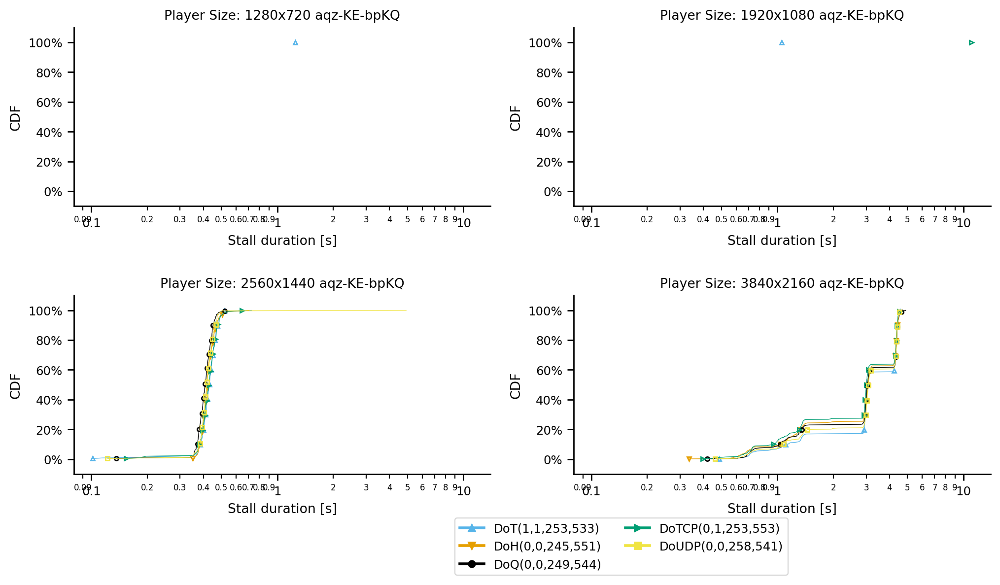

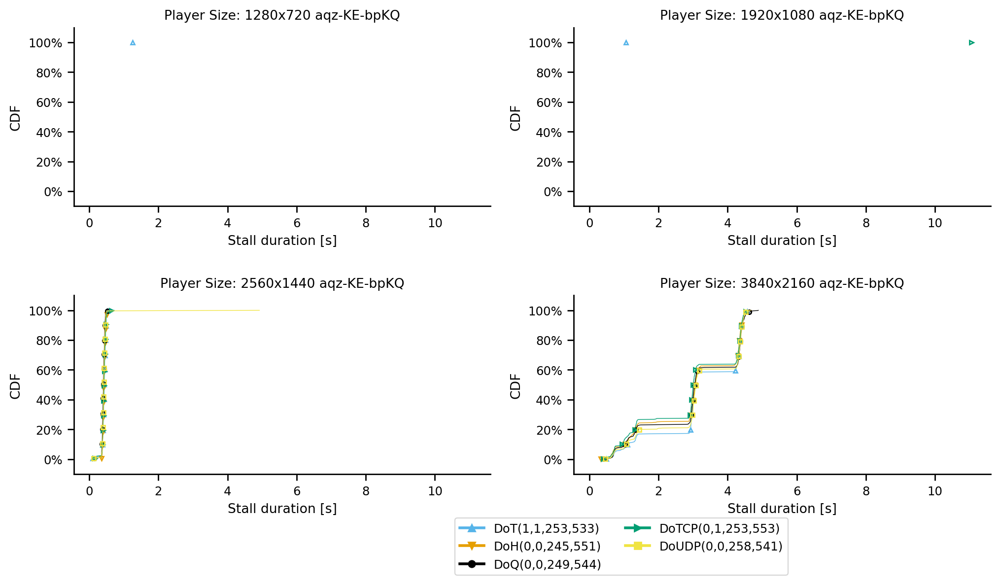

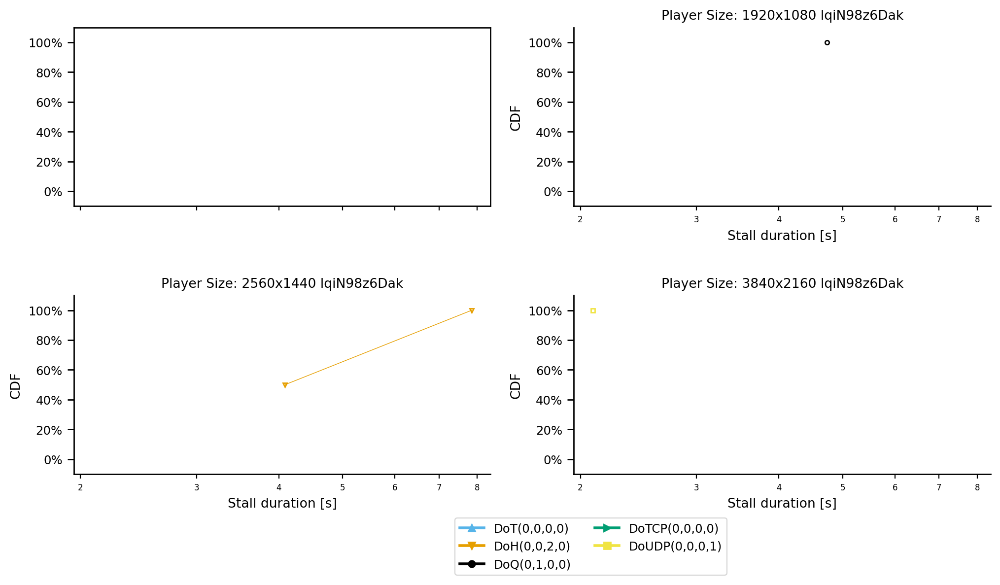

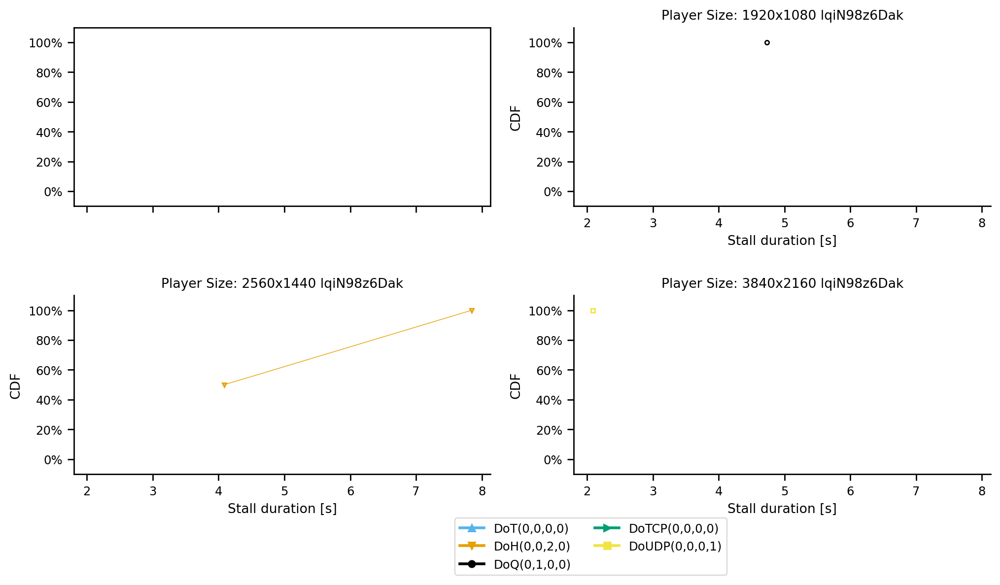

In [120]:
draw_cdf_grid(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0])

In [ ]:
draw_cdf(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0])

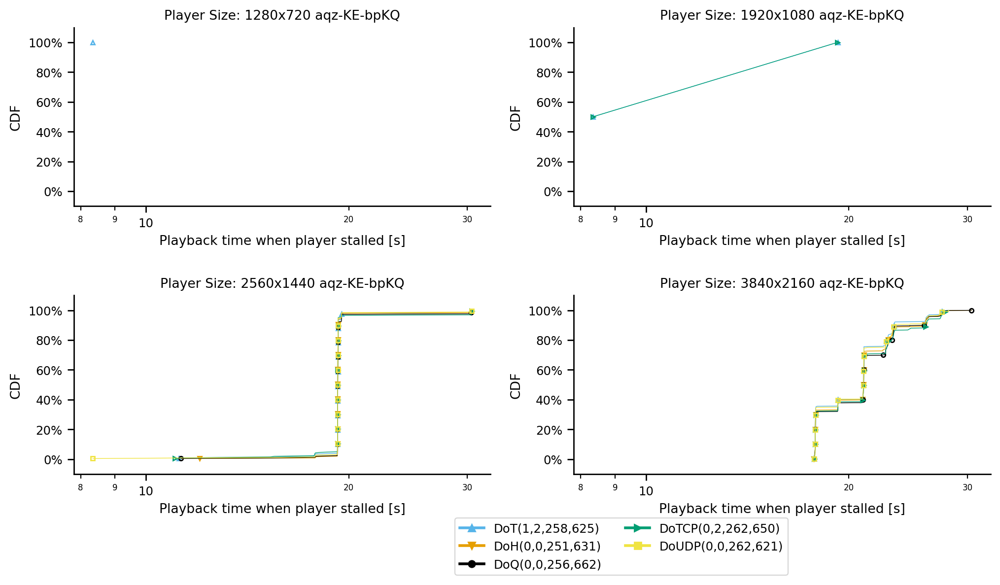

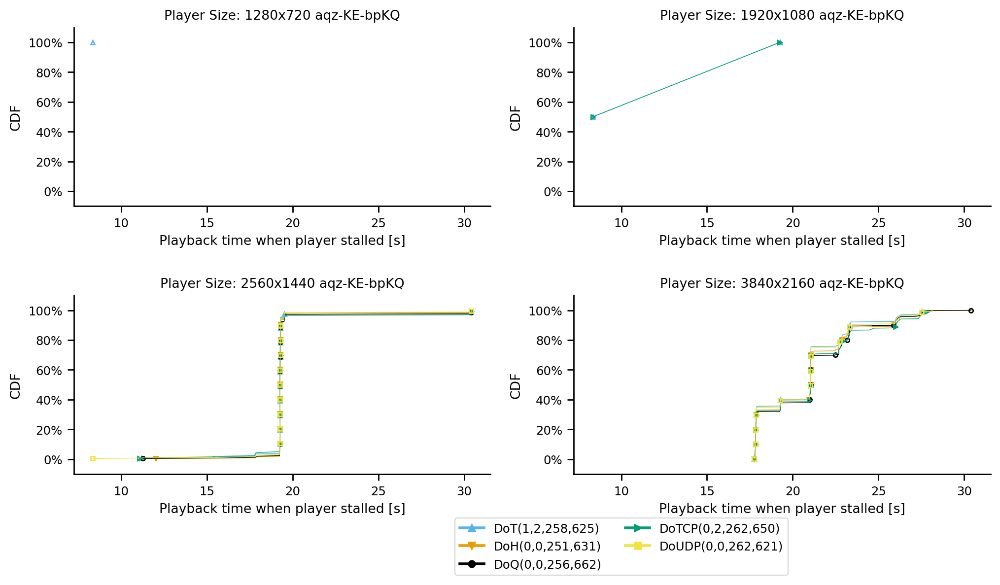

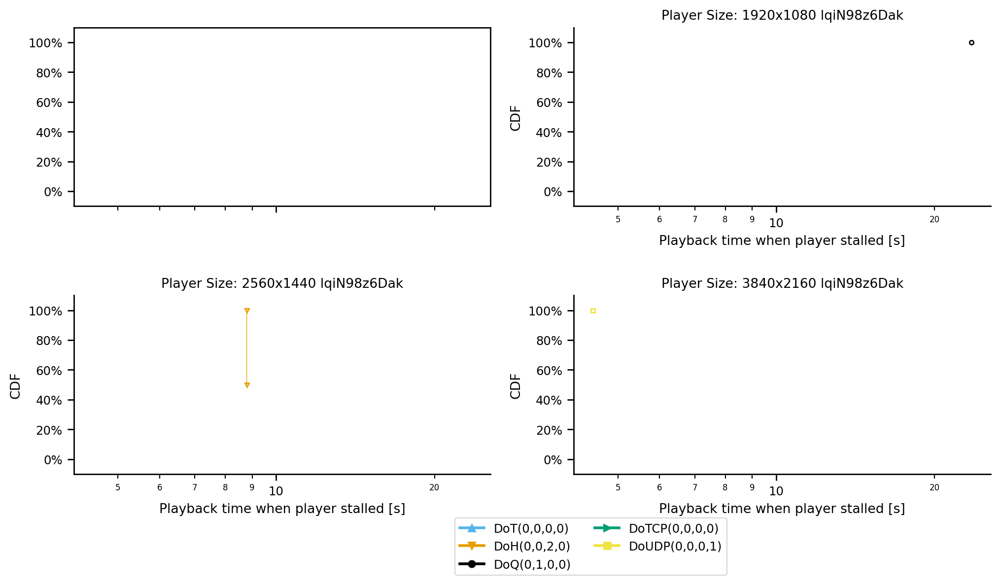

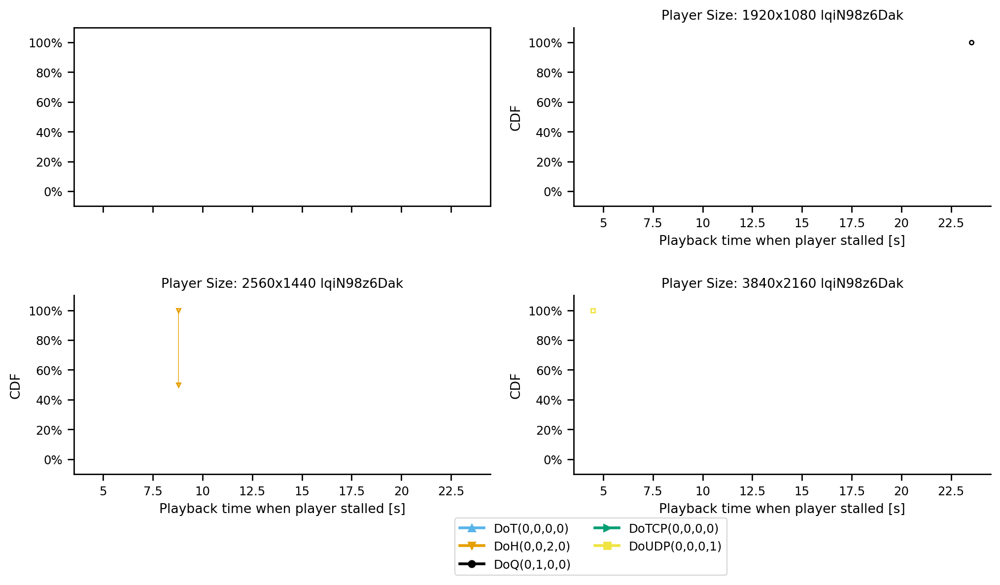

In [122]:
draw_cdf_grid(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0])

In [ ]:
draw_cdf(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0])

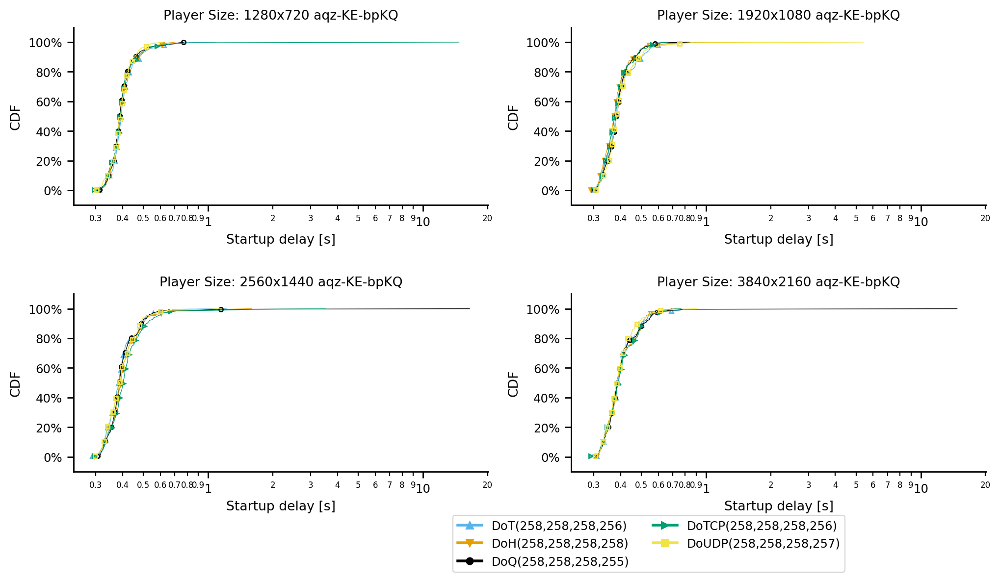

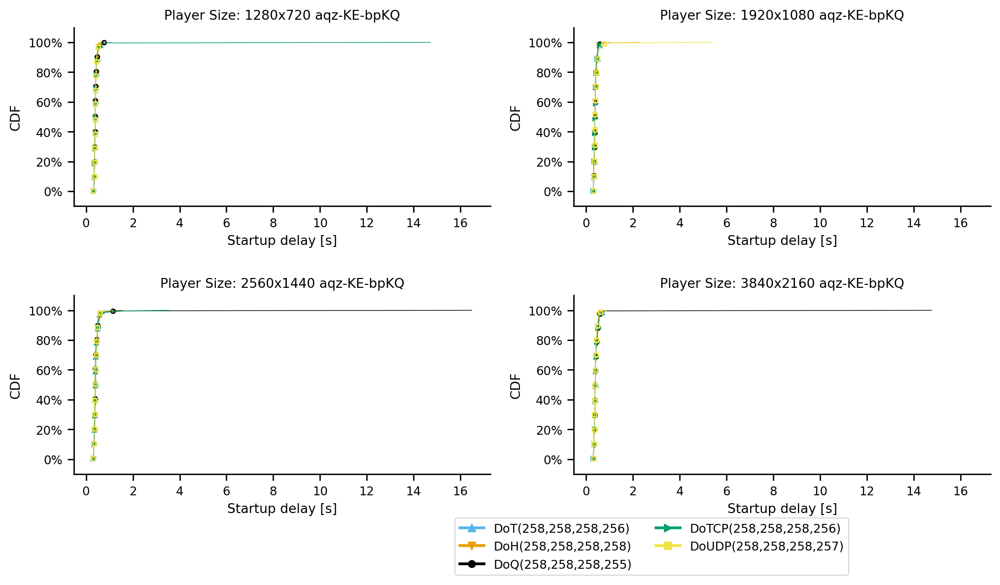

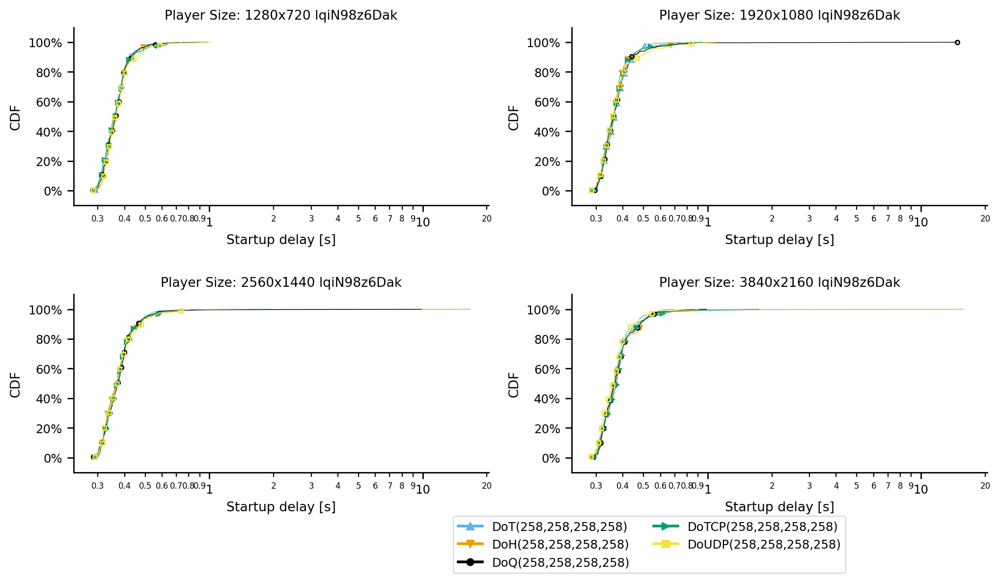

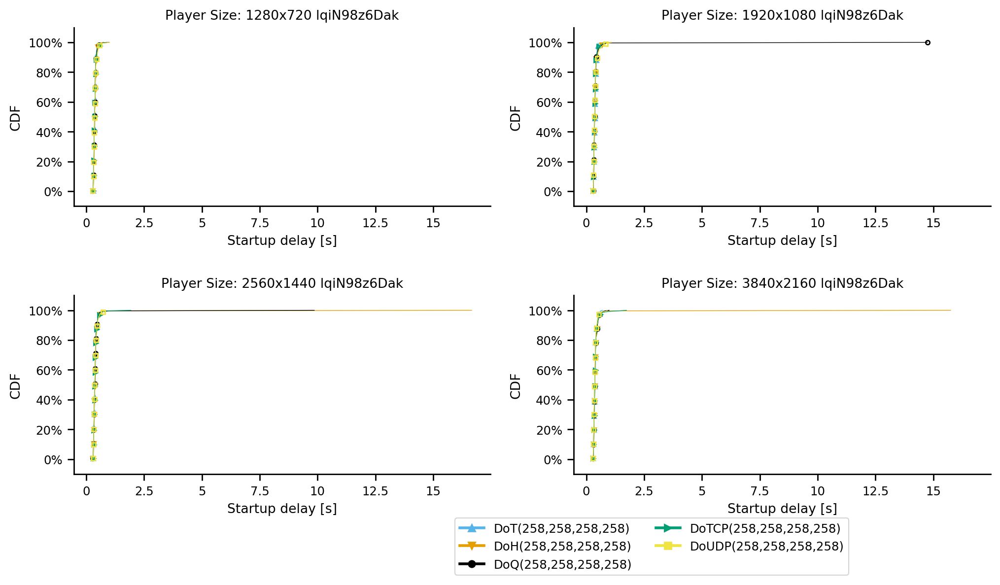

In [124]:
draw_cdf_grid(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0])

In [ ]:
draw_cdf(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0.1,1])

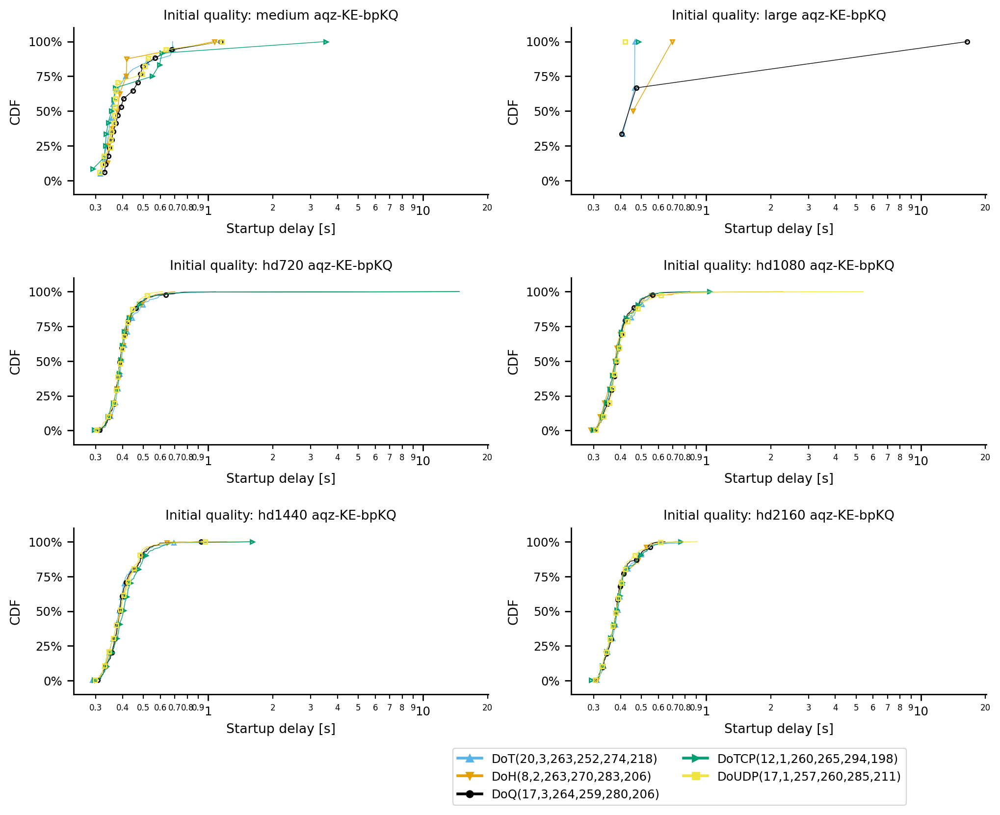

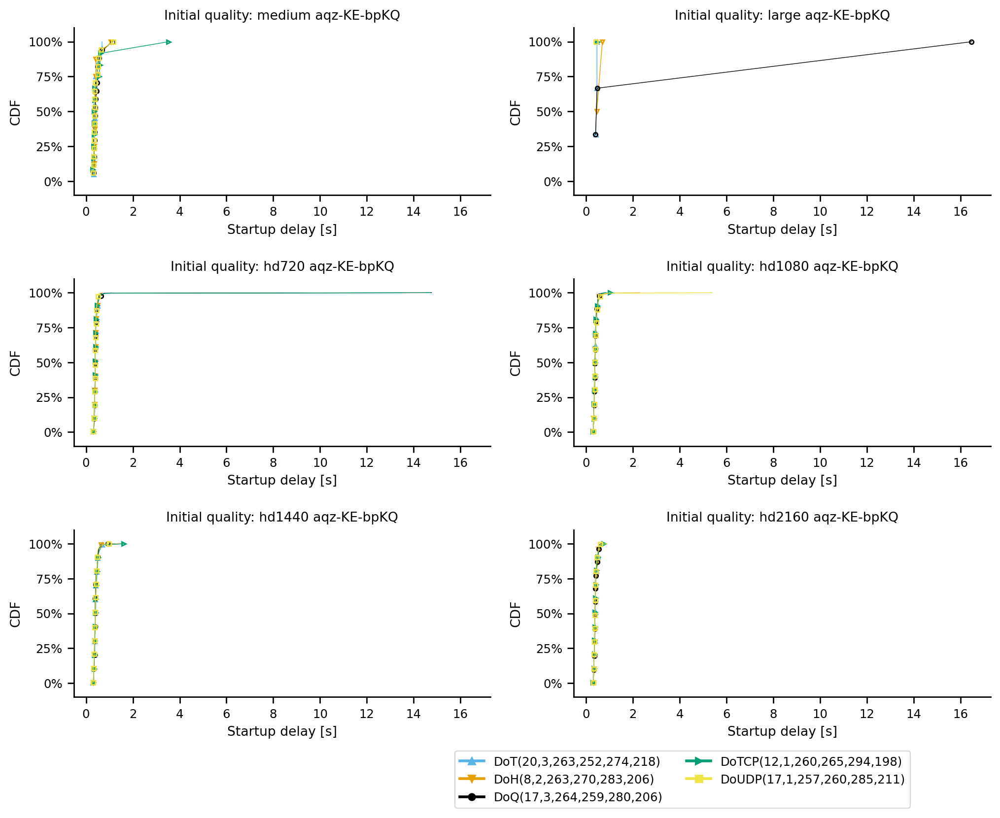

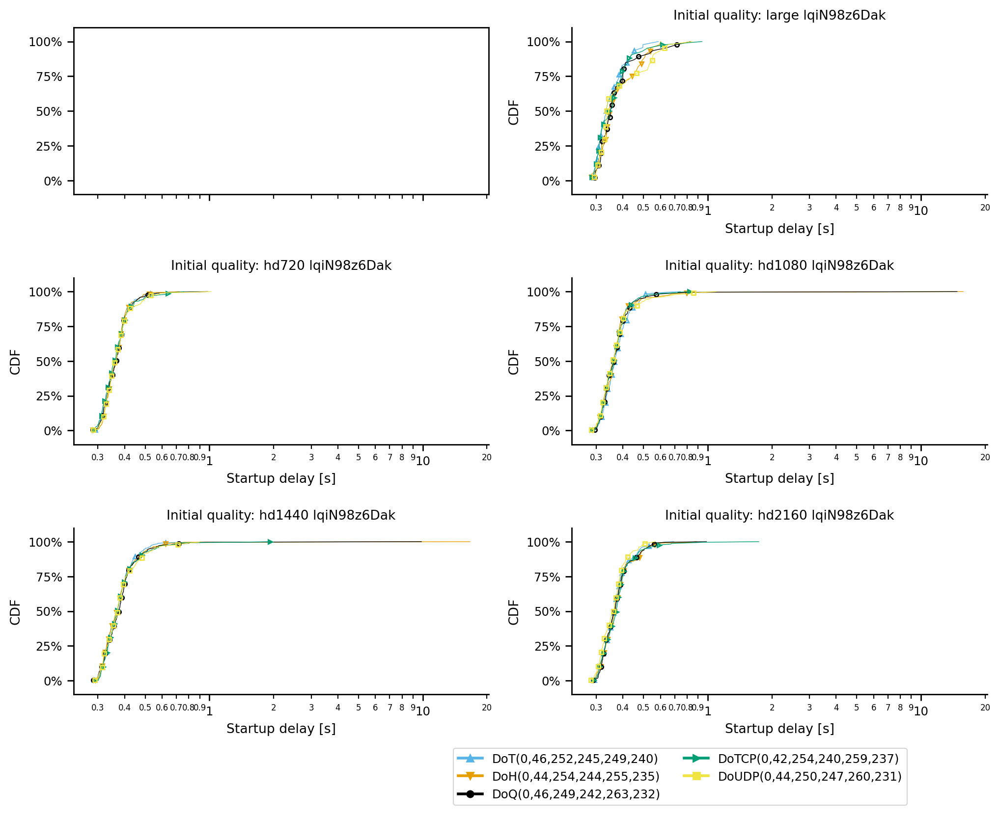

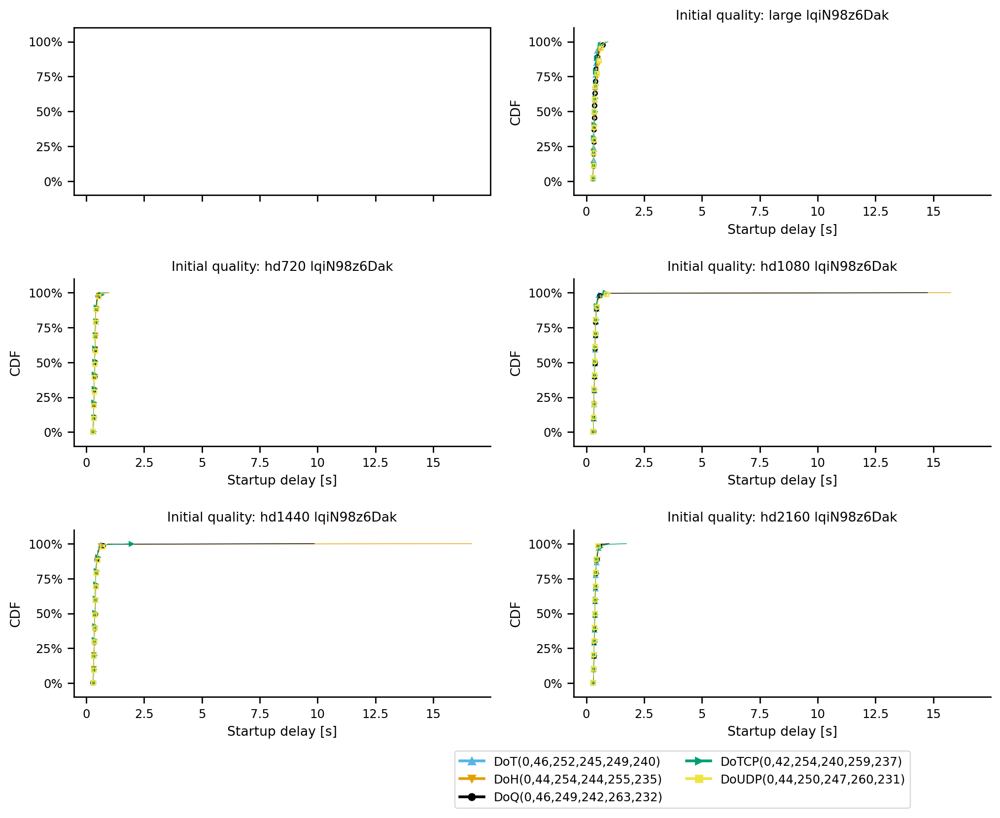

In [126]:
draw_cdf_grid(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0])

In [ ]:
draw_cdf(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0.1,1])

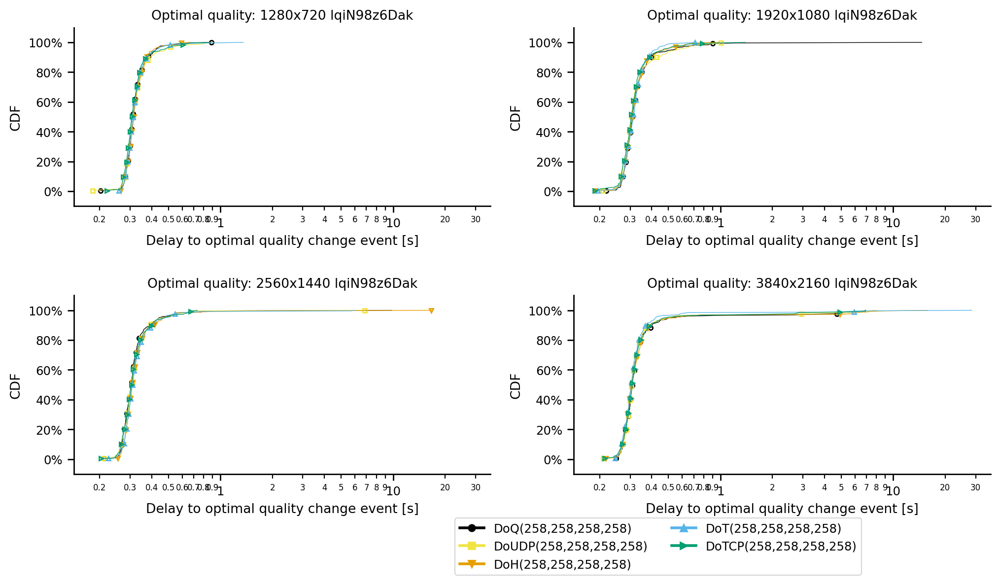

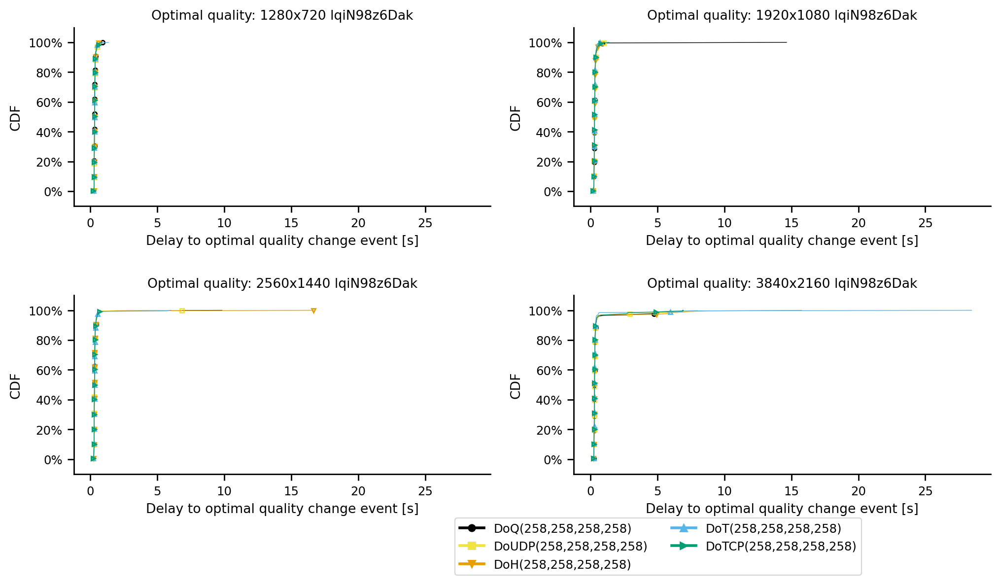

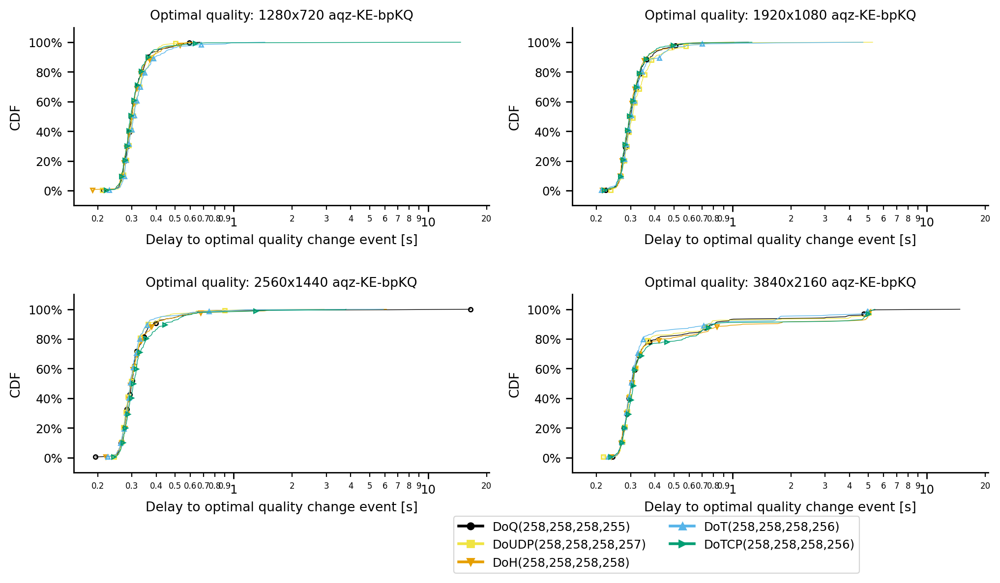

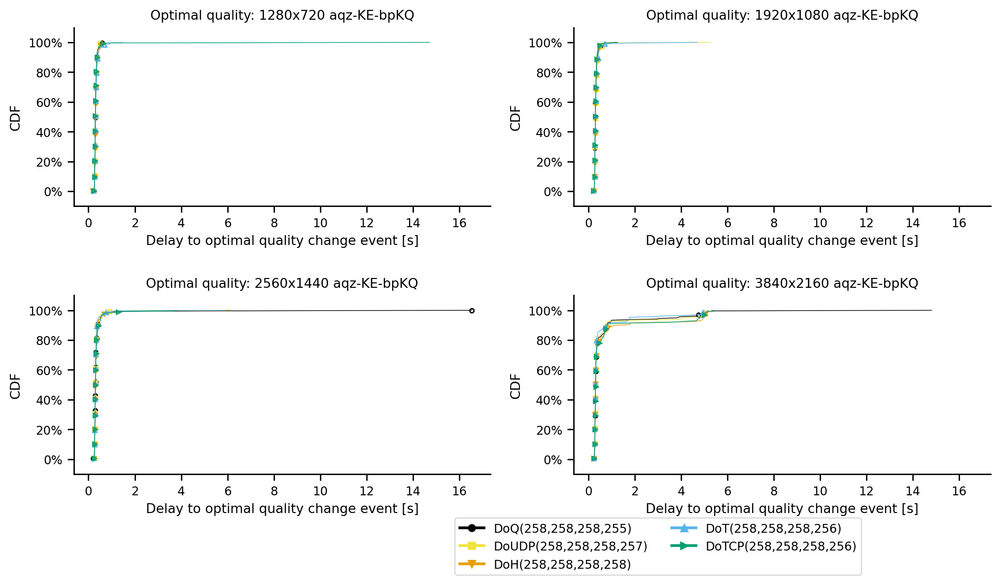

In [128]:
draw_cdf_grid(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True,False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0])

In [ ]:
draw_cdf(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True,False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0])

In [130]:
def draw_boxplot_grid(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, ylabel):
    proto_order=['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    if col_name_ == 'protocol':
        y_order = proto_order
    else:
        y_order = sorted(df_[col_name_].unique().tolist())
    with plt.style.context('seaborn-whitegrid'):
        for vp in df_['vantagePoint'].unique():
            print(vp)
            for video in df_['domain'].unique():
                for log in log_list:
                    num_rows = math.ceil(df_[col_outer_groupby_].nunique()/2)
                    if df_[col_outer_groupby_].nunique() > 1:
                        fig, axs = plt.subplots(num_rows, 2, sharex='all', figsize=(12,6*num_rows))#, sharey='all')
                        fig.subplots_adjust(hspace=.2, wspace=.3)
                        for col_grp_, ax in zip(df_[col_outer_groupby_].sort_values().unique(), axs.flat):
                        #for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                            lnwidth = .5
                            mrksize = 3
                            df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                            #hue=
                            
                            boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                            showfliers=False, order=y_order,
                            color='white',
                            meanline = True, showmeans = True, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                            sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                            
                            if log:
                                ax.set_xscale('log')
                            
                            
                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel(ylabel)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)

                            ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                            ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                        plt.show()

In [131]:
def draw_boxplot(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, ylabel):
    proto_order=['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    if col_name_ == 'protocol':
        y_order = proto_order
    else:
        y_order = sorted(df_[col_name_].unique().tolist())
    with plt.style.context('seaborn-whitegrid'):
        for vp in df_['vantagePoint'].unique():
            print(vp)
            for video in df_['domain'].unique():
                for log in log_list:
                    for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                        fig, ax = plt.subplots(figsize=(6,8))
                        #hue=
                        boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                        showfliers=False, order=y_order,
                        color='white',
                        meanline = True, showmeans = True, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                        sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                        
                        if log:
                            ax.set_xscale('log')
                        
                        
                        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


                        ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                        ax.set_xlabel(xlabel)

                        ax.set_ylabel(ylabel)
                        if xlim != [0,0]:
                            ax.set_xlim(xlim)

                        ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                        ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                        #plt.show()

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 6.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 6.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 38.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 34.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/

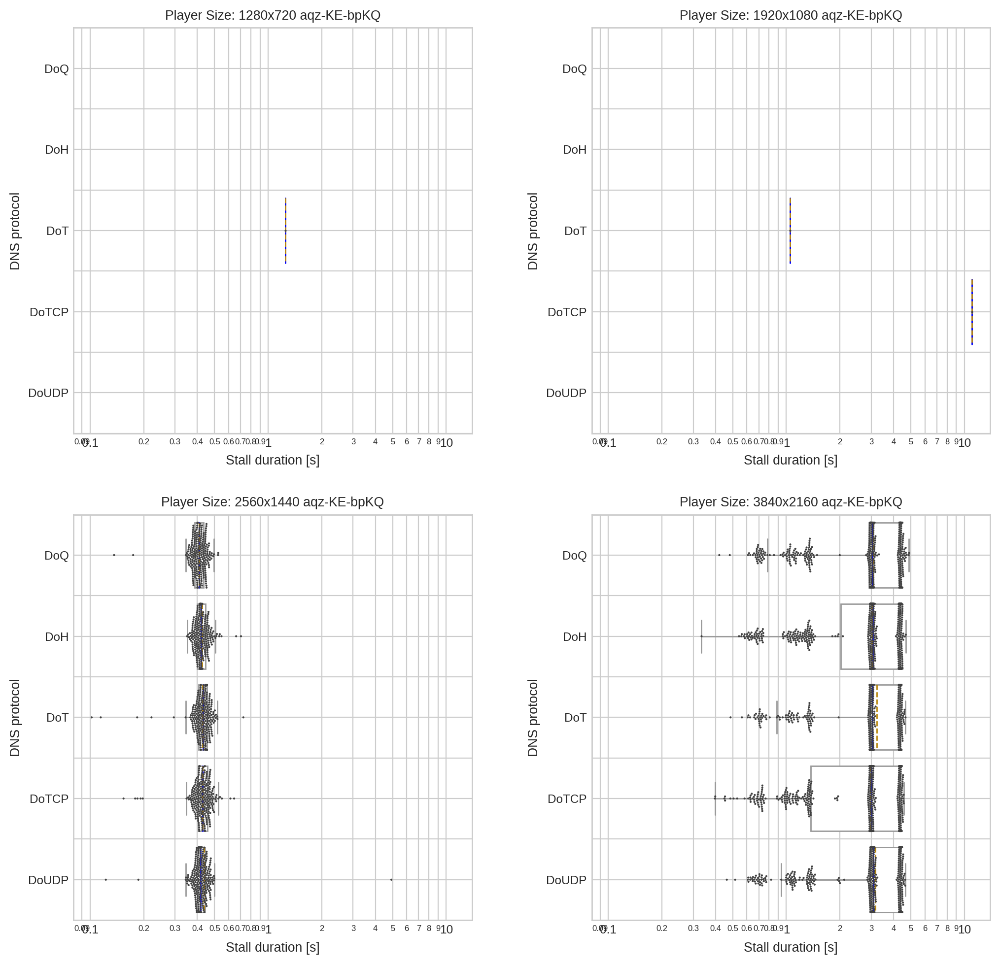

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 66.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 66.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

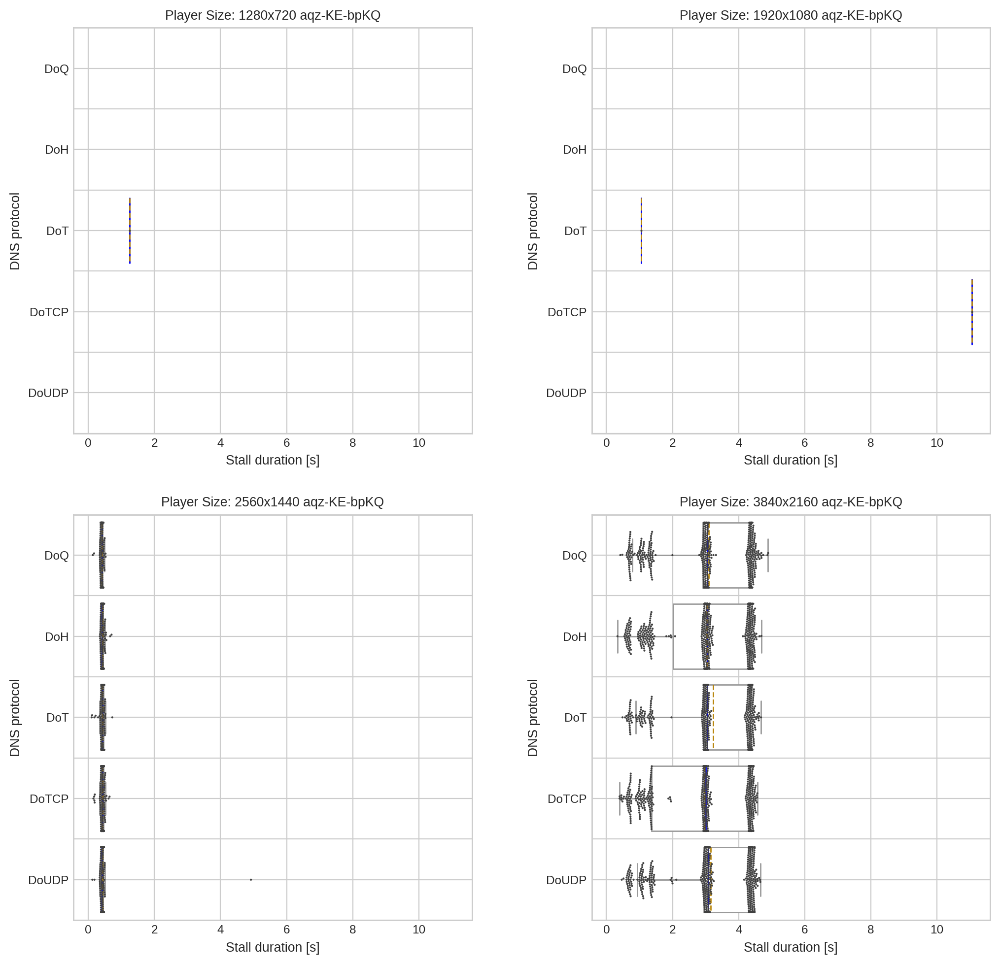

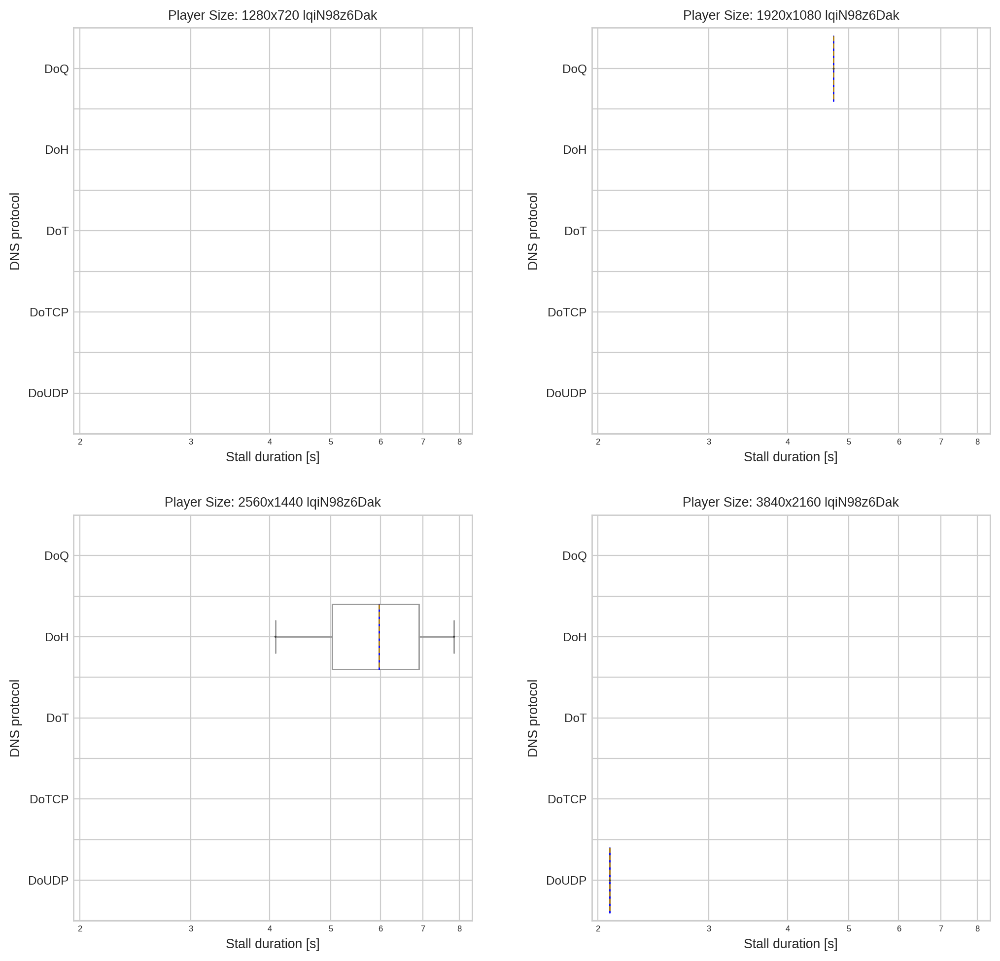

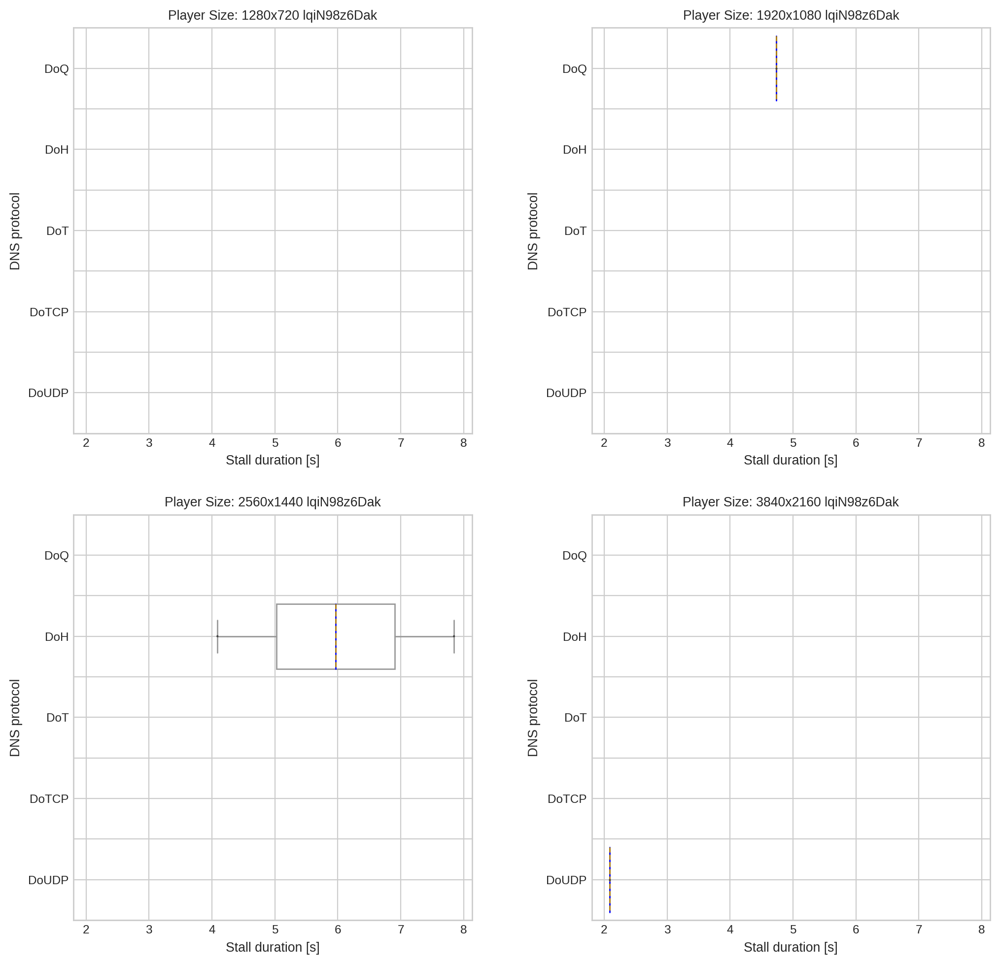

In [132]:
draw_boxplot_grid(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], "DNS protocol")

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 80.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 77.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

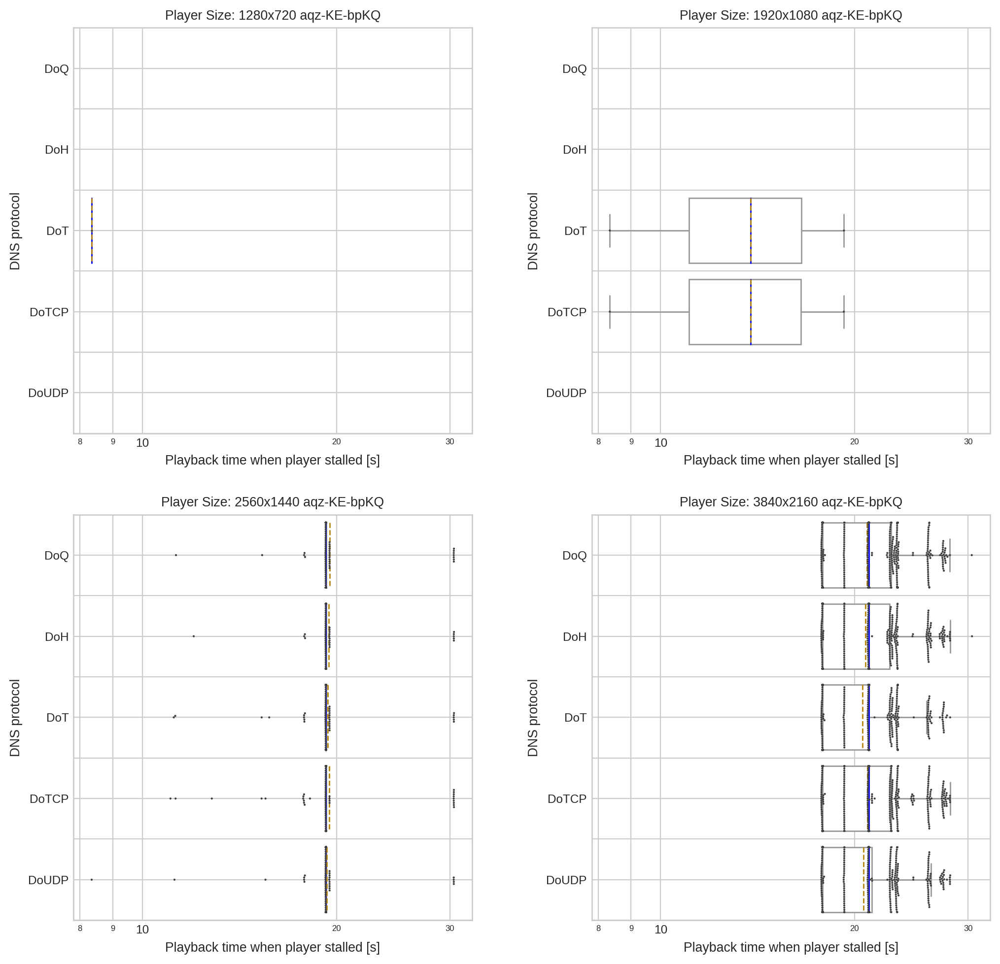

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 80.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 77.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

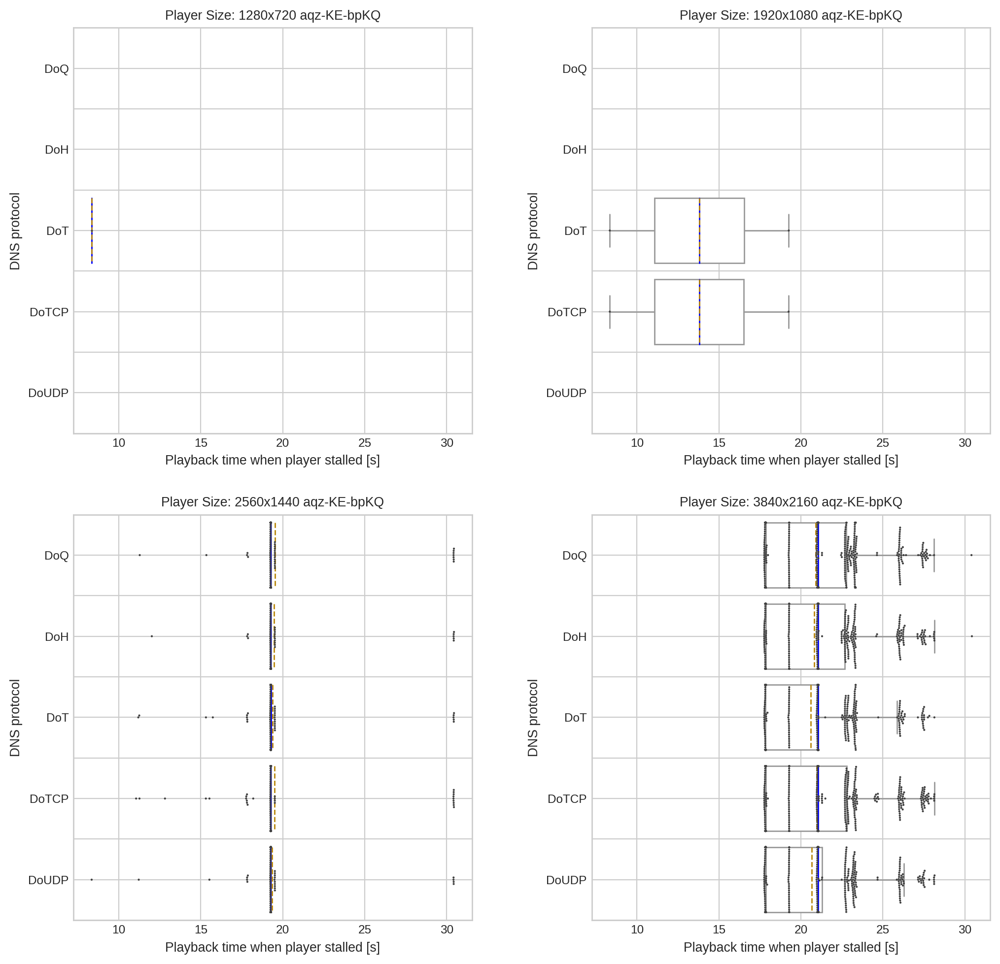

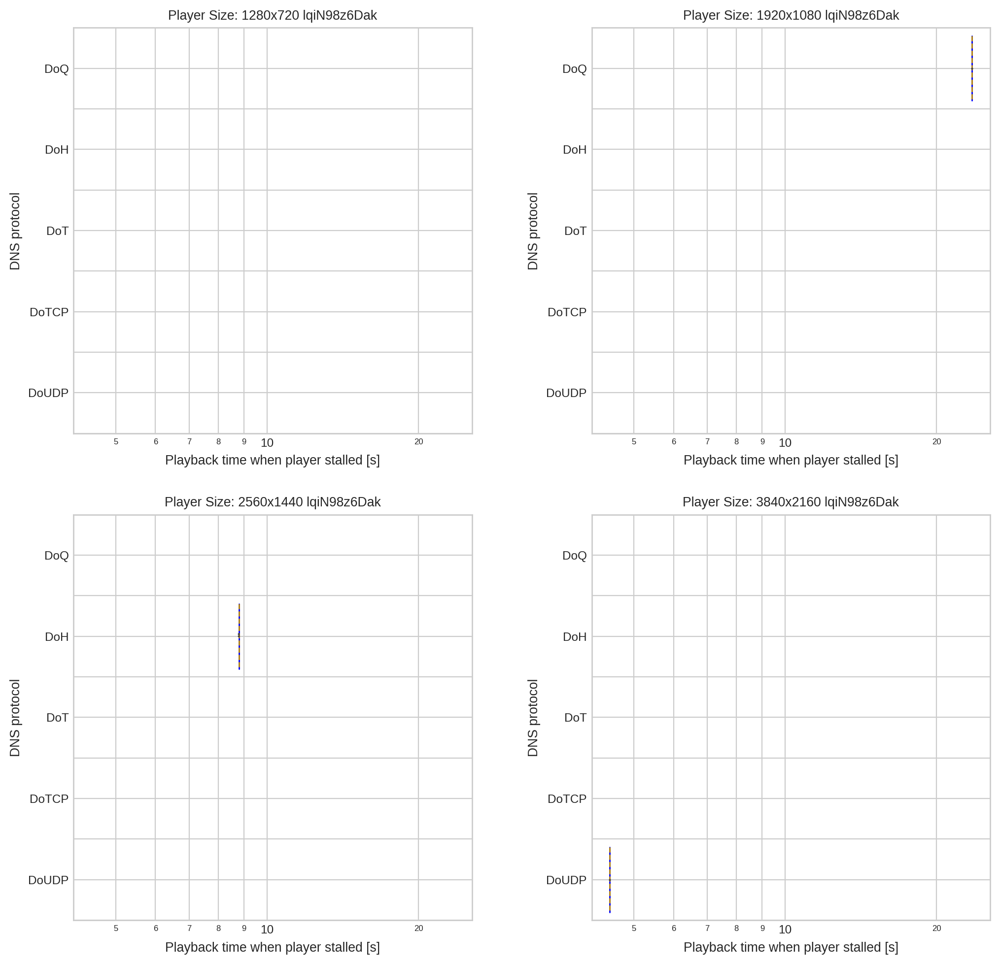

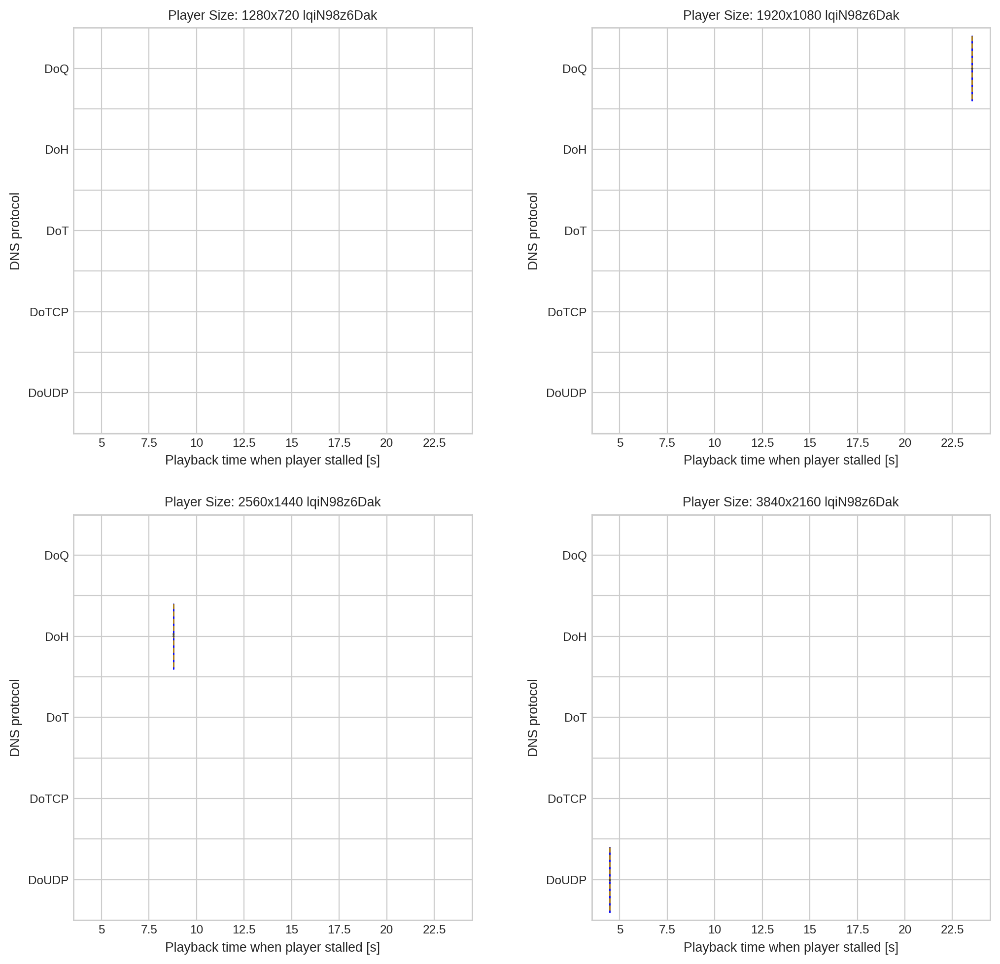

In [134]:
draw_boxplot_grid(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True, False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], "DNS protocol")

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 63.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


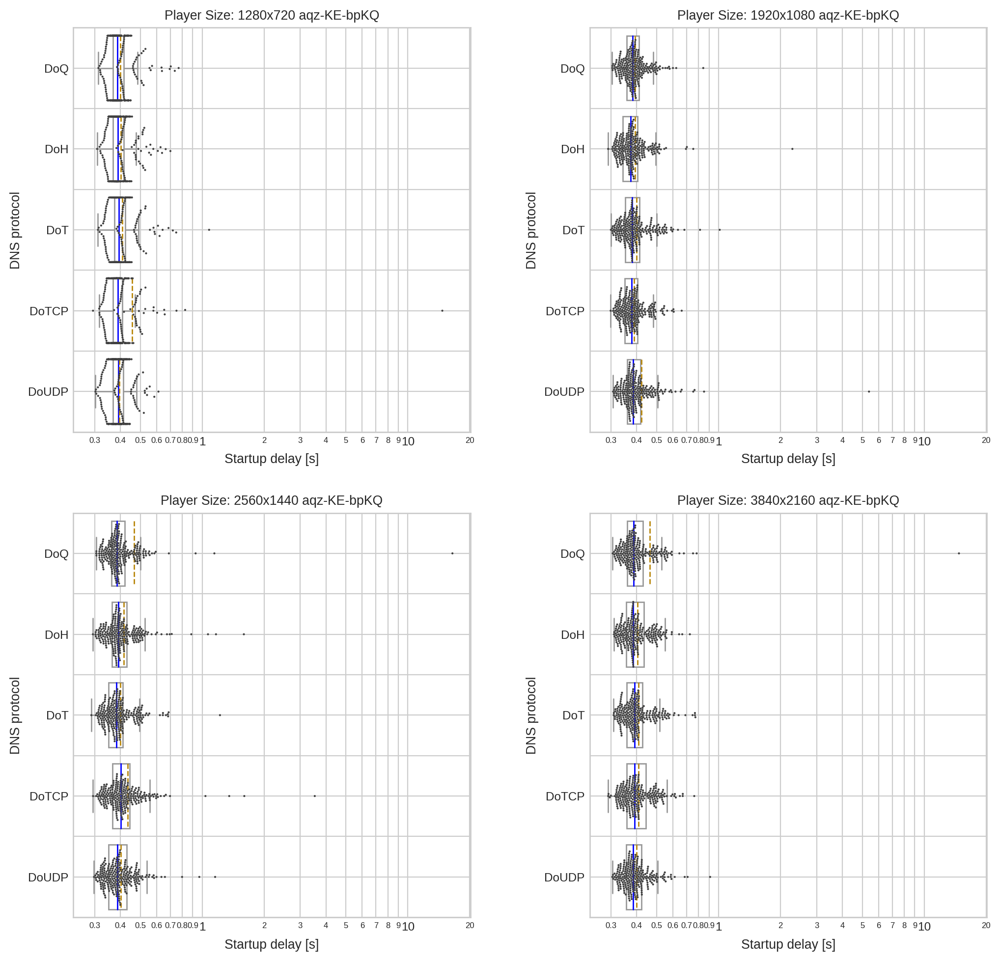

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 63.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

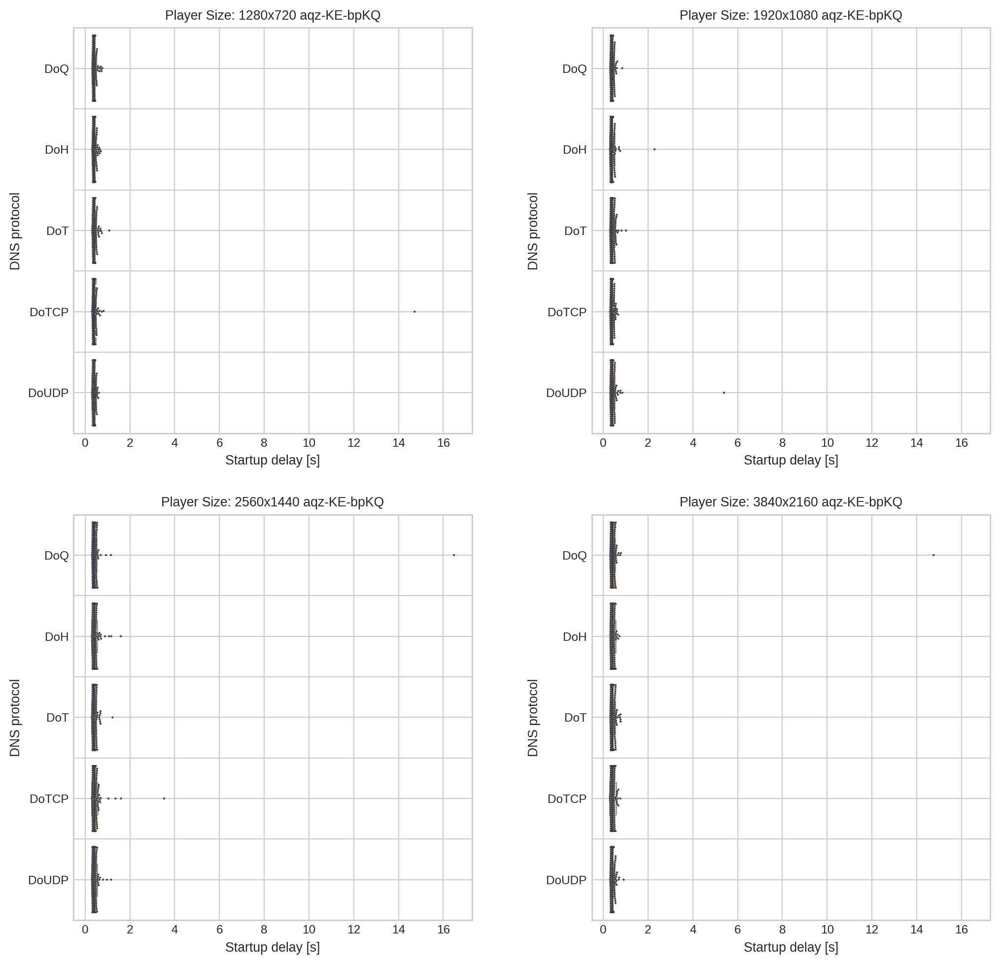

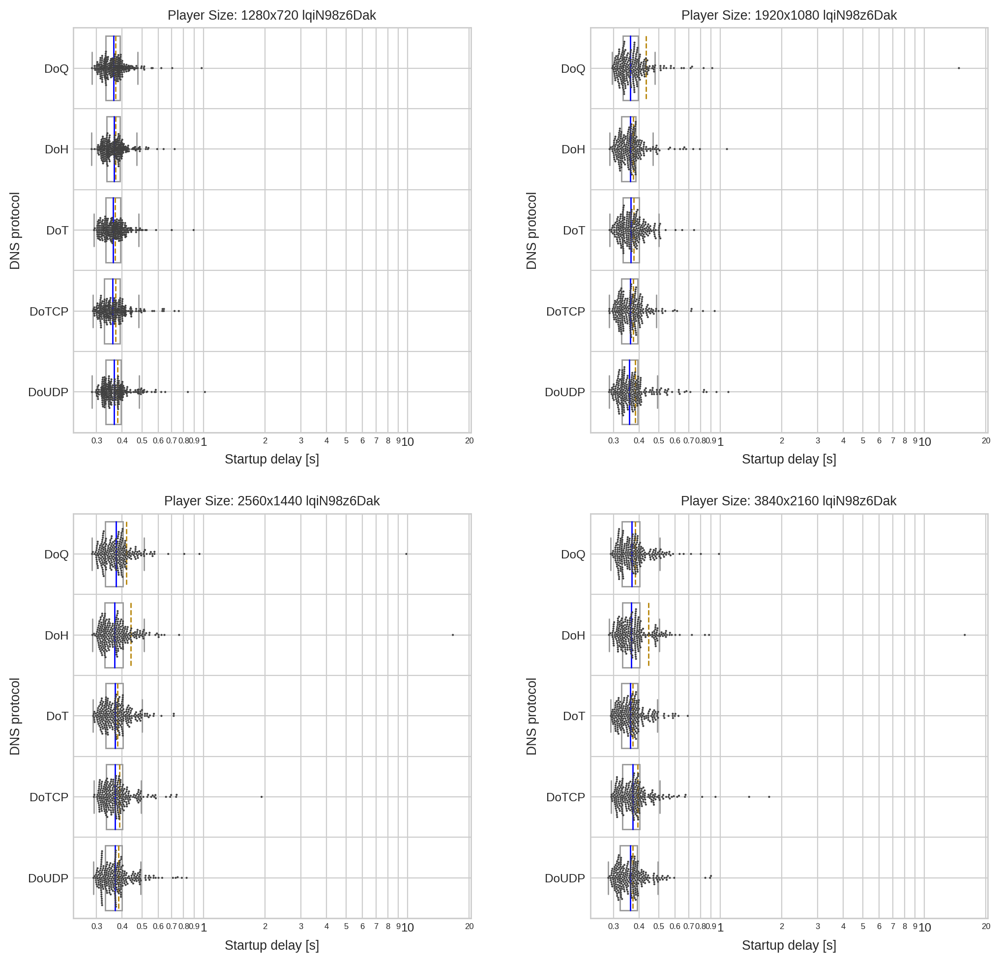

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 66.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 63.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

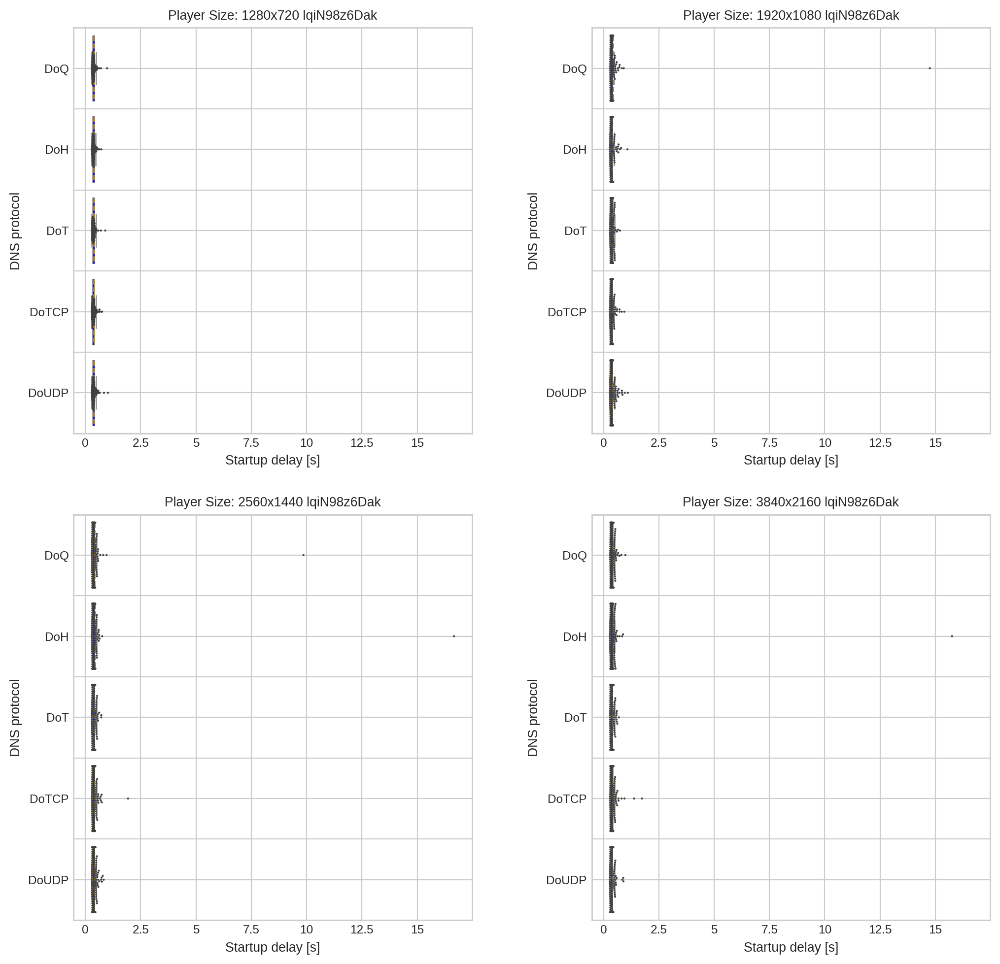

In [136]:
draw_boxplot_grid(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True, False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0], "DNS protocol")

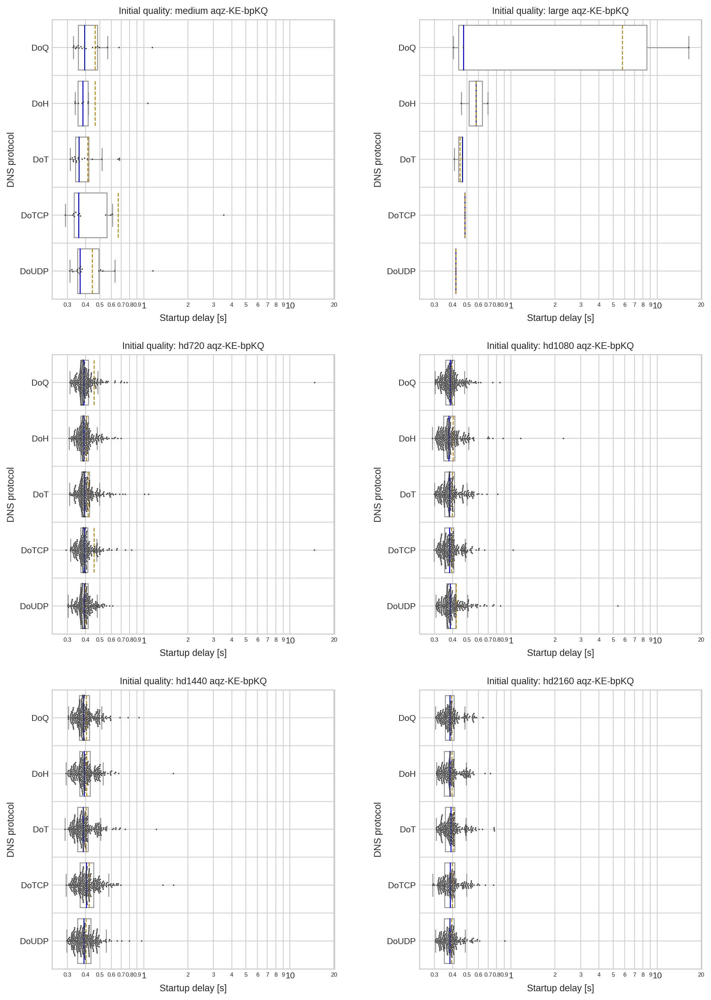

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 68.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

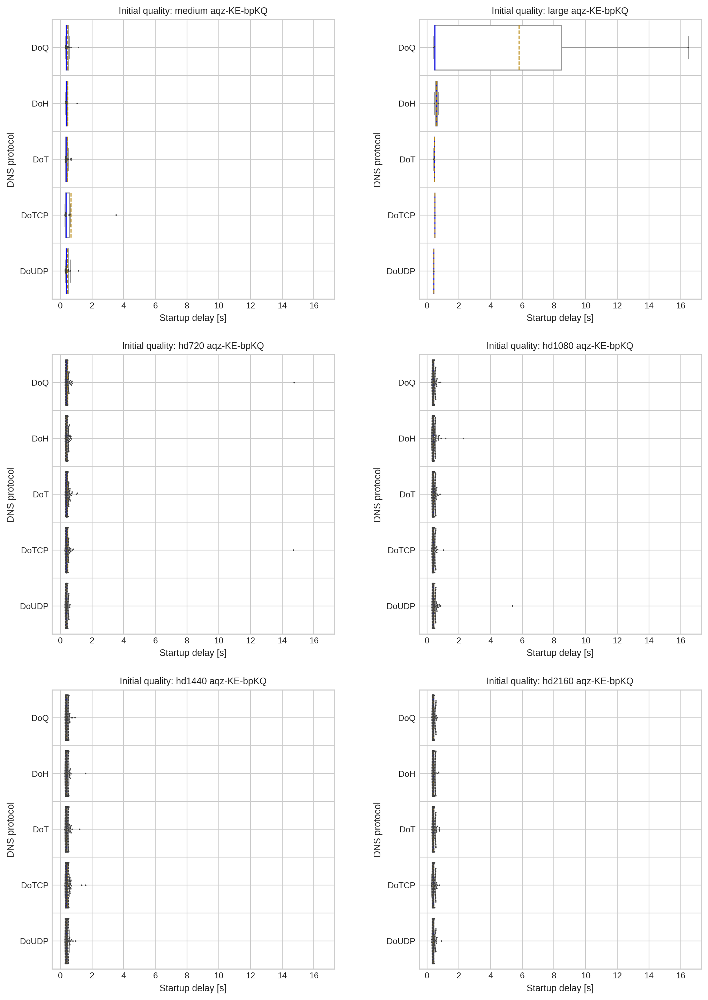

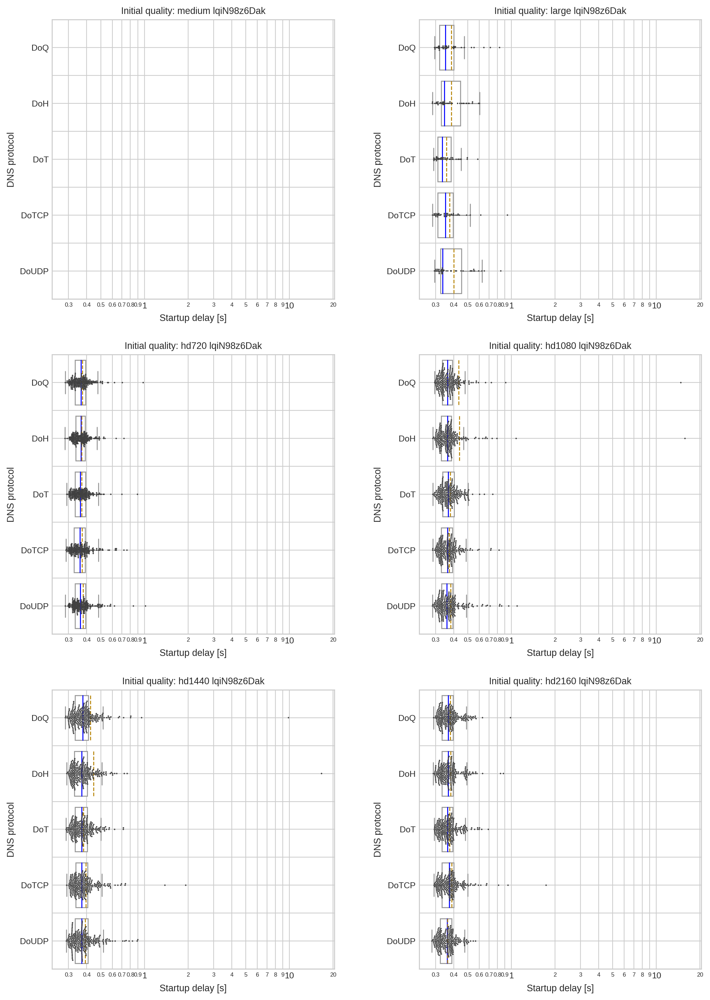

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 68.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

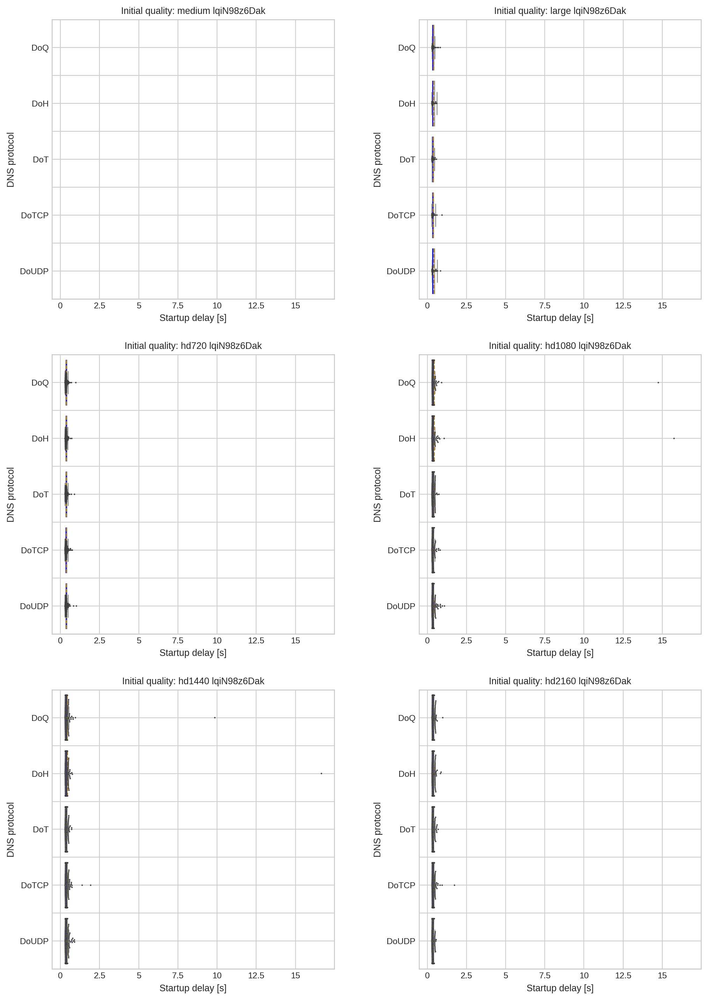

In [138]:
draw_boxplot_grid(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True, False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0], "DNS protocol")


In [ ]:
draw_boxplot(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0], "DNS protocol")


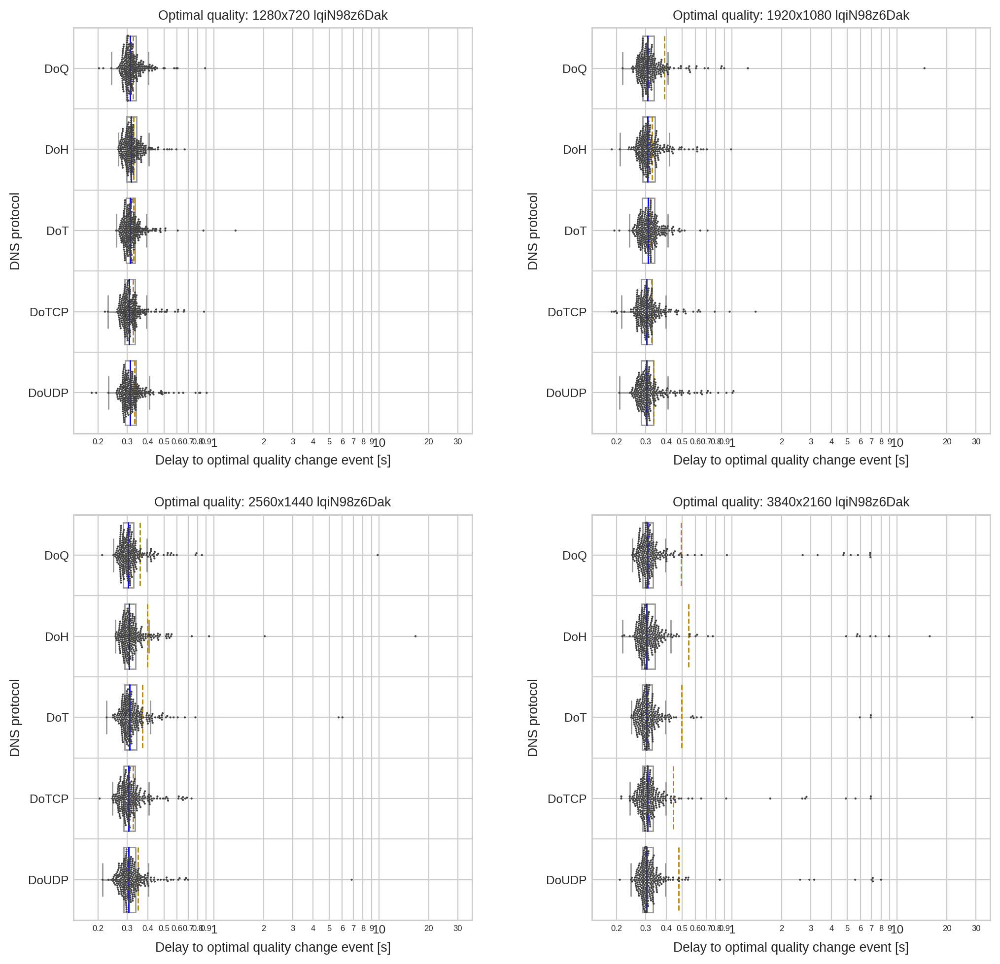

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

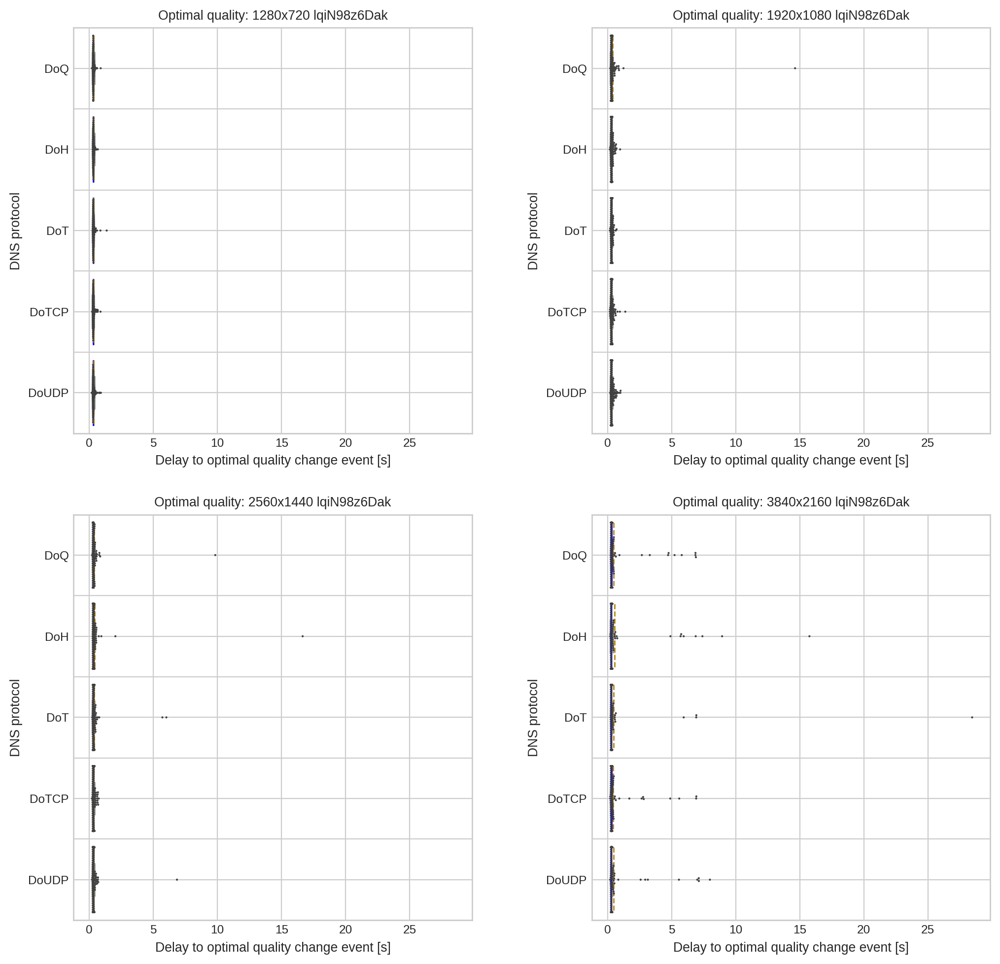

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 69.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 70.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


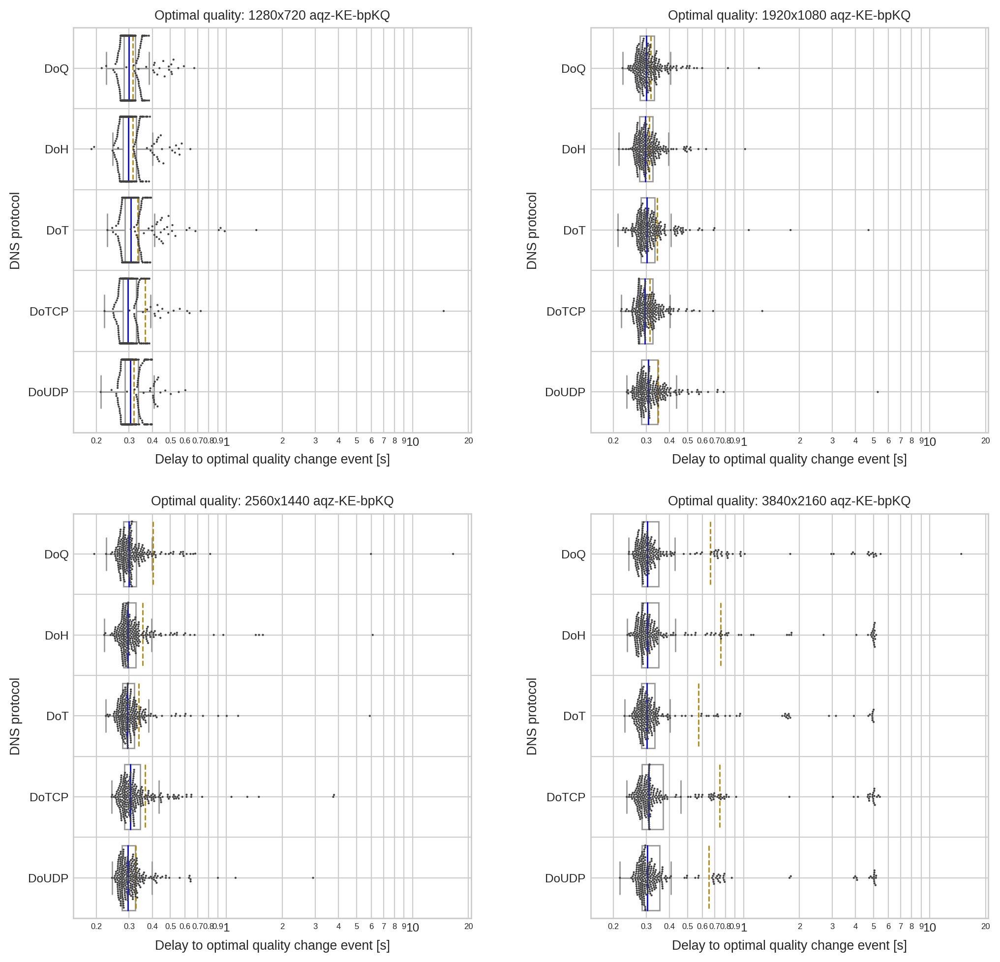

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 69.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 70.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/hom

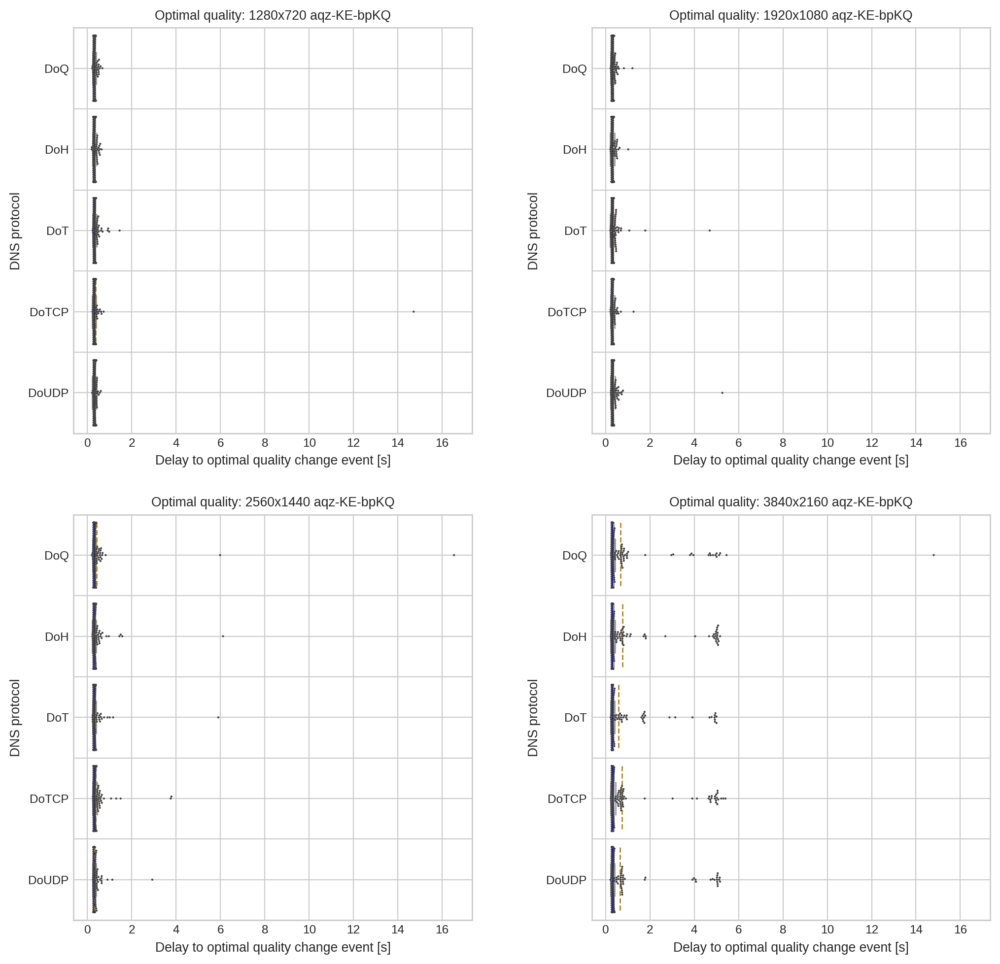

In [140]:
draw_boxplot_grid(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True, False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], "DNS protocol")

In [142]:
conn.close()